<center> <img src="https://d3i71xaburhd42.cloudfront.net/261c3e30bae8b8bdc83541ffa9331b52fcf015e6/3-Figure2-1.png" width=50% > </center>

<br><br>

<center> 
    <font size="6">Lab 1: Colour, Intrinsic Image Decomposition & Photometric Stereo</font> 
</center>
<center> 
    <font size="4">Computer Vision 1 University of Amsterdam</font> 
</center>
<center> 
    <font size="4">Due 23:59, September 13, 2024 (Amsterdam time)</font> 
</center>
<center> 
    <font size="4"><b>TA's: Xiaoyan, Floris, Adrian</b></font>
</center>

<br><br>

***

<br><br>

<center>

Student1 ID: 13209701 \
Student1 Name: Thomas Brouwer

Student2 ID: 15127206 \
Student2 Name: Piotr Sobecki

Student3 ID: 15713725 \
Student3 Name: Pedro Pombeiro Curvo

</center>

### **Import Libraries**

In [135]:

import sys

if sys.version_info[0] < 3:
    raise Exception("Python 3 or a more recent version is required.")

In [136]:
# environment and libraries
import os
import glob
import numpy as np
import random
import cv2
import matplotlib
import matplotlib.pyplot as plt

import warnings
warnings.simplefilter(action = "ignore", category = RuntimeWarning)
warnings.simplefilter(action = "ignore", category = UserWarning)

from mpl_toolkits.mplot3d import Axes3D

In [137]:
# Make sure you're using the provided environment!
assert cv2.__version__ == "4.10.0", "You're not using the provided Python environment!"
assert np.__version__ == "1.26.4", "You're not using the provided Python environment!"
assert matplotlib.__version__ == "3.9.2", "You're not using the provided Python environment!"
# Proceed to the next cell if you don't get any error.

### **Instructions**

Your code and discussion must be handed in this jupyter notebook, renamed to **StudentID1_StudentID2_StudentID3.ipynb** before the deadline by submitting it to the Canvas Lab 1 Assignment. Please also fill out your names and ID's above.

For full credit, make sure your notebook follows these guidelines:
- It is mandatory to **use the Python environment provided** with the assignment; the environment specifies the package versions that have to be used to prevent the use of particular functions. Using different packages versions may lead to grade deduction. In the Python cell above you can check whether your environment is set up correctly.
- To install the environment with the right package versions, use the following command in your terminal: ```conda env create --file=cv1_environment.yaml```, then activate the environment using the command ```conda activate cv1```.
- Do not use additional packages or materials that have not been provided or explicitly mentioned.
- Please express your thoughts **concisely**. The number of words does not necessarily correlate with how well you understand the concepts.
- Answer all given questions and sub-questions.
- Try to understand the problem as much as you can. When answering a question, give evidences (qualitative and/or quantitative results, references to papers, figures etc.) to support your arguments. Note that not everything might be explicitly asked for and you are expected to think about what might strengthen you arguments and make the notebook self-contained and complete.
- Tables and figures must be accompanied by a **brief** description. Do not forget to add a number, a title, and if applicable name and unit of variables in a table, name and unit of axes and legends in a figure.

__Note:__ A more complete overview of the lab requirements can be found in the Course Manual on Canvas

Late submissions are not allowed. Assignments that are submitted after the strict deadline will not be graded. In case of submission conflicts, TAs’ system clock is taken as reference. We strongly recommend submitting well in advance, to avoid last minute system failure issues.

Plagiarism note: Keep in mind that plagiarism (submitted materials which are not your work) is a serious crime and any misconduct shall be punished with the university regulations. This includes the use of generative tools such as ChatGPT.

**ENSURE THAT YOU SAVE ALL RESULTS / ANSWERS ON THE QUESTIONS (EVEN IF YOU RE-USE SOME CODE).**

### **Overview**

- [Section 1: Colour Spaces (13 points)](#section-1)
  - [Question 1 (2 points)](#question-1)
  - [Question 2 (6 points)](#question-2)
  - [Question 3 (2 points)](#question-3)
  - [Question 4 (2 points)](#question-4)
  - [Question 5 (1 point)](#question-5)
- [Section 2: Colour Constancy (13 points)](#section-2)
  - [Question 6 (8 points)](#question-6)
  - [Question 7 (2 points)](#question-7)
  - [Question 8 (3 points)](#question-8)
- [Section 3: Intrinsic Image Decomposition (14 points)](#section-3)
  - [Question 9 (2 points)](#question-9)
  - [Question 10 (2 points)](#question-10)
  - [Question 11 (4 points)](#question-11)
  - [Question 12 (2 points)](#question-12)
  - [Question 13 (2 points)](#question-13)
  - [Question 14 (2 points)](#question-14)
- [Section 4: Photometric Stereo (60 points)](#section-4)
  - [Question 15 (4 points)](#question-15)
  - [Question 16 (2 points)](#question-16)
  - [Question 17 (1 point)](#question-17)
  - [Question 18 (2 points)](#question-18)
  - [Question 19 (2 points)](#question-19)
  - [Question 20 (5 points)](#question-20)
  - [Question 21 (3 points)](#question-21)
  - [Question 22 (6 points)](#question-22)
  - [Question 23 (2 points)](#question-23)
  - [Question 24 (3 points)](#question-24)
  - [Question 25 (3 points)](#question-25)
  - [Question 26 (2 points)](#question-26)
  - [Question 27 (4 points)](#question-27)
  - [Question 28 (5 points)](#question-28)
  - [Question 29 (2 points)](#question-29)
  - [Question 30 (2 points)](#question-30)
  - [Question 31 (4 points)](#question-31)
  - [Question 32 (1 point)](#question-32)
  - [Question 33 (2 points)](#question-33)
  - [Question 34 (2 points)](#question-34)
  - [Question 35 (1 point)](#question-35)
  - [Question 36 (4 points)](#question-36)
  - [Question 37 (1 point)](#question-37)
- [Section X: Individual Contribution Report (Mandatory)](#section-x)

<a id="section-1"></a>
### **Section 1: Colour Spaces**

In this part of the assignment, you will study the different colour spaces for image representations and experiment how to convert a given RGB image to a specific colour space

<a id="question-1"></a>
#### <font color='#FF0000'>Question 1 (2 points)</font>

Why do we use the RGB color model as the basis for our digital cameras and photography? How does a standard digital camera capture a full RGB color image?

##### <font color='yellow'>Answer:</font>

> We use the RGB color model as it is closely aligned with the human visual system. As Glassner explains, there are 3 types of cones in the human eye, which respond to different wavelenghts of light, namely short, medium and long wavelenghts [1]. Those wavelengths roughly correspond to the colors blue, green and red. Moreover, Glassner states that any color can be created by an appropriate combination of red, blue and green [1].
>
>A standard digital camera captures a full RGB color image by the following steps:
>1. First, the cameras sense the incoming light features. Older cameras used vidicons for that, while more modern cameras usually have 3 separate RGB sensing chips [4]. The sensors detect the intensity of light [4].
>2. Then, a Color Filtering Array (CFA) is used for processing colours. The Bayer filter, which has a grid pattern of green, red and blue tiles, is the most commonly used filter.
>3. Then, the process known as demosaicing is applied in order to reconstruct the missing colour values for each of the pixels in the grid [4]. This is necessary since the CFA from step 2 is unable to capture the intensity of more than one light color channel at a single tile.
>4. Usually, some kind of color balancing operation is performed in order to equalize RGB values [4].



<a id="question-2"></a>
#### <font color='#FF0000'>Question 2 (6 points)</font>

Create a function to convert an RGB image into various color spaces using the provided `convert_colour_space()` function and other sub-functions.

**Color Spaces to Convert:**

1. **Grayscale**

   Convert the RGB image into grayscale using 3 different methods mentioned in [John D. Cook's blog](https://www.johndcook.com/blog/2009/08/24/algorithms-convert-color-grayscale/). Additionally, check and report which method OpenCV uses for grayscale conversion, include it as well, and visualize all 4 methods in the same figure.

2. **Opponent Color Space**

   $\begin{pmatrix}
   O_1 \\
   O_2 \\
   O_3
   \end{pmatrix}$ = $\begin{pmatrix}
   \frac{R-G}{\sqrt{2}} \\
   \frac{R+G-2B}{\sqrt{6}} \\
   \frac{R+G+B}{\sqrt{3}}
   \end{pmatrix}$

3. **Normalized RGB (rgb) Color Space**

   $\begin{pmatrix}
   r \\
   g \\
   b
   \end{pmatrix}$ = $\begin{pmatrix}
   \frac{R}{R+G+B} \\
   \frac{G}{R+G+B} \\
   \frac{B}{R+G+B}
   \end{pmatrix}$

4. **HSV Color Space**

   Convert the RGB image into HSV Color Space using OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2HSV)*.

5. **YCbCr Color Space**

   Convert the RGB image into YCbCr Color Space using OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2YCrCb)*. Arrange the channels in $Y, C_b,$ and $C_r$ order.

**Note:** 

- Ensure you understand the data types and ranges required by the Python conversion and image displaying functions. This usually means [0, 1] for float datatype or [0, 255] for integer datatype. Explicitly change the datatype if necessary.

- Each color space may have its own visualization requirements. For instance, think about how to meaningfully visualize the H, S, and V channels. Ensure each channel is visualized in an RGB manner where applicable.

**Extra:** It might be interesting to visualize the image in its original color space (RGB) as well.

In [138]:
def convert_rgb_to_grays(input_image):
    '''
    Converts an RGB image into grayscale using different methods and 
    returns the grayscale images stacked as separate channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing different grayscale conversion methods
    '''

    # convert input image to array format if not already
    # YOUR CODE HERE
    if not isinstance(input_image, np.ndarray):
        input_image = np.array(input_image)

    # extract the color channels for further calculations
    R = input_image[:,:,0]
    G = input_image[:,:,1]
    B = input_image[:,:,2]
    
    # lightness method
    # The lightness method averages the most prominent and least prominent colors: 
    # (max(R, G, B) + min(R, G, B)) / 2.
    # YOUR CODE HERE
    lightness = (np.maximum(R, np.maximum(G, B)) + np.minimum(R, np.minimum(G, B))) / 2

    # average method
    # YOUR CODE HERE
    average = np.average(input_image, axis = 2)
    # luminosity method
    # YOUR CODE HERE
    luminosity = 0.21*R + 0.72*G + 0.07*B
    # built-in OpenCV function
    # YOUR CODE HERE
    '''
    RGB2GRAY defined here: https://docs.opencv.org/3.4/de/d25/imgproc_color_conversions.html#color_convert_rgb_gray
    RGB[A] to Gray:Y←0.299⋅R+0.587⋅G+0.114⋅B
    '''
    opencv = cv2.cvtColor(input_image, cv2.COLOR_RGB2GRAY)
    
    # stack the results to easily visualize the 4 different methods
    new_image = np.stack([lightness, average, luminosity, opencv], axis=-1)
    return new_image

In [139]:
def convert_rgb_to_opponent(input_image):
    '''
    Converts an RGB image into the opponent color space and 
    returns the image with opponent color channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing opponent color space
    '''

    # YOUR CODE HERE
    # convert input image to array format if not already
    if not isinstance(input_image, np.ndarray):
        input_image = np.array(input_image)

    # extract the color channels for further calculations
    R = input_image[:,:,0]
    G = input_image[:,:,1]
    B = input_image[:,:,2]

    # Compute O1,O2,O3
    O1 = (R-G) / np.sqrt(2)
    O2 = (R+G-2*B) / np.sqrt(6)
    O3 = (R+G+B) / np.sqrt(3)

    # Normalize to [0,1] range
    
    # -255/sqrt(2) <= O1 <= 255/sqrt(2)
    maxO1 = 255/np.sqrt(2)
    minO1 = -255/np.sqrt(2)
    O1 = (O1 - minO1)/(maxO1 - minO1)
    
    # (-2*255)/sqrt(6) <= O2 <= (2*255)/sqrt(6)
    maxO2 = (2*255)/np.sqrt(6)
    minO2 = (-2*255)/np.sqrt(6)
    O2 = (O2 - minO2)/(maxO2 - minO2)

    # 0 <= O3 <= 3*255/sqrt(3)
    maxO3 = 3*255/np.sqrt(3)
    minO3 = 0
    O3 = (O3 - minO3)/(maxO3 - minO3)

    # Ensure the values are within [0, 1] (Even after the normalization, the value could slightly exceed 1 due to numerical imprecision)
    O1 = np.clip(O1, 0, 1)
    O2 = np.clip(O2, 0, 1)
    O3 = np.clip(O3, 0, 1)
    
    # stack the channels
    new_image = np.stack((O1, O2, O3), axis=-1)

    return new_image

In [140]:
def convert_rgb_to_normedrgb(input_image):
    '''
    Converts an RGB image into the normalized RGB (nrgb) color space and 
    returns the image with normalized RGB channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing normalized RGB color space
    '''

    # YOUR CODE HERE
    # convert input image to array format if not already
    if not isinstance(input_image, np.ndarray):
        input_image = np.array(input_image)

    # extract the color channels for further calculations
    R = input_image[:,:,0]
    G = input_image[:,:,1]
    B = input_image[:,:,2]

    # calculate nrgb
    denominator = (R+G+B)
    r = R/denominator
    g = G/denominator
    b = B/denominator

    # stack the channels
    new_image = np.stack((r, g, b), axis=-1)

    return new_image

In [141]:
def convert_colour_space(input_image, colourspace):
    '''
    Converts an RGB image into a specified color space and 
    returns the image in its new color space.

    Args:
        input_image: RGB image
        colourspace: colour space to be converted to. 
        - choices: opponent, nrgb, hsv, ycbcr, grays

    Returns:
        new_image: image with channels in provided colour space
    '''

    # Convert the image into double precision for conversions
    input_image = input_image.astype(np.float32)

    if colourspace.lower() == 'opponent':
        # fill in the rgb2opponent function

        new_image = convert_rgb_to_opponent(input_image)

    elif colourspace.lower() == 'nrgb':
        # fill in the rgb2normedrgb function

        new_image = convert_rgb_to_normedrgb(input_image)

    elif colourspace.lower() == 'hsv':
        # use built-in function from opencv
        new_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2HSV)
        
    elif colourspace.lower() == 'ycbcr':
        # use built-in function from opencv
        
        # YOUR CODE HERE
        temp_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2YCrCb)
        Y, Cr, Cb = temp_image[:,:,0], temp_image[:,:,1], temp_image[:,:,2]
        new_image = np.stack((Y, Cb, Cr), axis = -1)

    elif colourspace.lower() == 'grays':
        # fill in the rgb2grays function

        new_image = convert_rgb_to_grays(input_image)

    else:
        raise NotImplementedError('Unknown colorspace type [%s]...' % colourspace)

    return new_image

<a id="question-3"></a>
#### <font color='#FF0000'>Question 3 (2 points)</font>

Visualize the image in each new color space and its individual channels separately within the same figure. For example, for the HSV color space, visualize the converted HSV image and its Hue, Saturation, and Value channels separately (4 images in 1 figure). Ensure that the channel visualizations are **meaningful**.

The function `visualize_colourspace` below needs to be completed.

In [142]:
def visualize_colourspace(image, colourspace='rgb'):
    """
    Visualize the image in its corresponding colour space.
    This function visualizes 1 figure with 4 images.
    Hint: some RGB representation of the new colour space image + each of its channels

    Args:
        image: image with channels of some colour space
        colourspace: colour space to be converted to. 
        - choices: opponent, nrgb, hsv, ycbcr, grays
    """

    suptitle = ''
    channels = []
    channels_titles = []

    if colourspace == 'opponent':
        # Create empty arrays for each channel
        O1_channel = np.zeros_like(image)
        O2_channel = np.zeros_like(image)
        O3_channel = np.zeros_like(image)

        # Set only the respective channel to be non-zero
        O1_channel[:,:,0] = image[:,:,0] 
        O2_channel[:,:,1] = image[:,:,1]
        O3_channel[:,:,2] = image[:,:,2]

        channels = [O1_channel, O2_channel, O3_channel]
        channels_titles = ['O1', 'O2', 'O3']
        suptitle = 'Opponent colourspace'

    elif colourspace in ['rgb', 'nrgb']:
        # Create empty arrays for each channel
        red_channel = np.zeros_like(image)
        green_channel = np.zeros_like(image)
        blue_channel = np.zeros_like(image)
        # Set only the respective channel to be non-zero
        red_channel[:,:,0] = image[:,:,0]  # Red
        green_channel[:,:,1] = image[:,:,1]  # Green
        blue_channel[:,:,2] = image[:,:,2]  # Blue

        # Create a figure with 2 rows and 2 columns
        plt.figure(figsize=(10, 5))

        # Add appropriate title
        if colourspace == 'nrgb':
            suptitle = 'nRGB colourspace'
        else: # rgb
            suptitle = 'RGB colourspace'

        channels = [red_channel, green_channel, blue_channel]
        channels_titles = ['Red Channel', 'Green Channel', 'Blue Channel']

    elif colourspace == 'hsv':
        # Normalize to [0,1] range
        H = image[:,:,0]
        S = image[:,:,1]
        V = image[:,:,2]
    
        # 0 <= H <= 360
        maxH = 360
        minH = 0
        H = (H - minH)/(maxH - minH)
        
        # 0 <= S,V =< 255
        maxSV = 255
        minSV = 0

        S = (S - minSV)/(maxSV - minSV)
        V = (V - minSV)/(maxSV - minSV)

        # stack the normalised channels
        image = np.stack((H, S, V), axis=-1)

        hue_channel = np.zeros_like(image)
        hue_channel[:,:,0] = H
        hue_channel[:,:,1] = np.full_like(S, 0.0)
        hue_channel[:,:,2] = np.full_like(V, 0.0)

        channels = [hue_channel, S, V]
        channels_titles = ['Hue Channel', 'Saturation Channel', 'Value Channel']
        suptitle = 'HSV colourspace'

    elif colourspace == 'ycbcr':
        suptitle = 'YCbCr colourspace'
        Y = image[:,:,0]
        Cb = image[:,:,1]
        Cr = image[:,:,2]

        channels = [Y, Cb, Cr]
        channels_titles = ['Y Channel', 'Cb Channel', 'Cr Channel']

    elif colourspace == 'grays':
        suptitle = 'Grays colourspace'

        channels = [image[:,:,0], image[:,:,1], image[:,:,2], image[:,:,3]]
        channels_titles = ['lightness method', 'average method', 'luminosity method', 'opencv method']

    else:
        raise NotImplementedError('Unknown colorspace type [%s]...' % colourspace)

    # Create a figure to plot all 4 conversion method results
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))
    fig.suptitle(suptitle, fontsize=16)

    for i, ax in enumerate(axs[:-1]):
        ax.imshow(channels[i], cmap='gray')
        ax.set_title(channels_titles[i])
        ax.axis('off')

    if len(channels) > 3:
        axs[-1].imshow(channels[-1], cmap='gray')
        axs[-1].set_title(channels_titles[-1])
        axs[-1].axis('off')
    else:
        axs[-1].imshow(image)
        axs[-1].set_title('All channels')
        axs[-1].axis('off')
    
    plt.show()

<Figure size 1000x500 with 0 Axes>

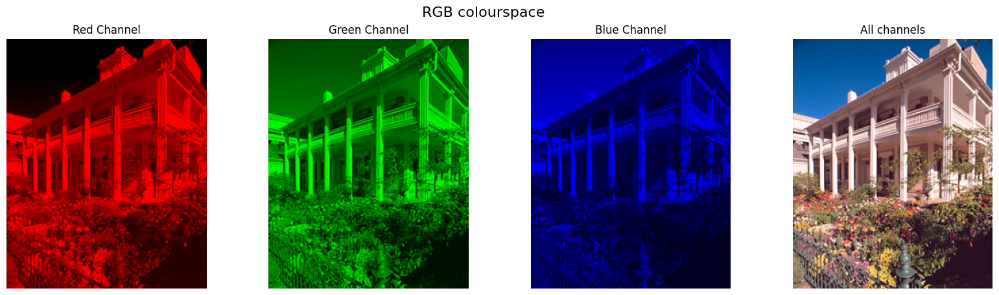

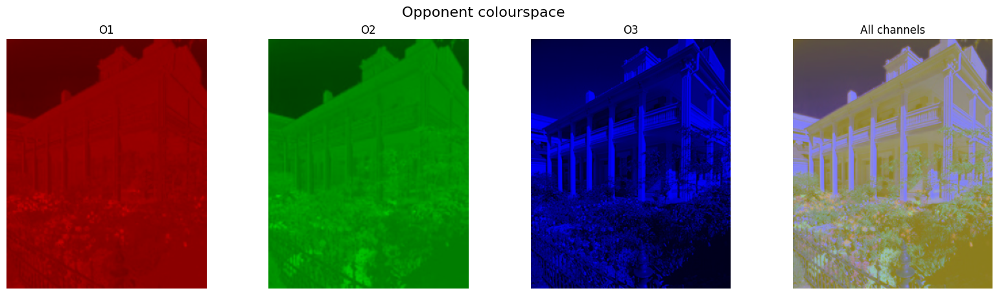

<Figure size 1000x500 with 0 Axes>

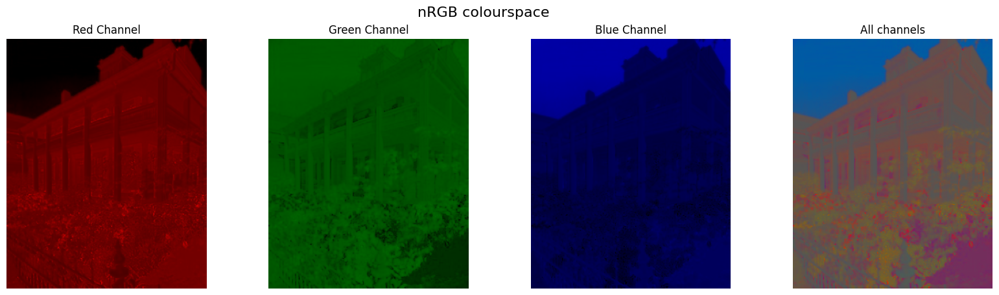

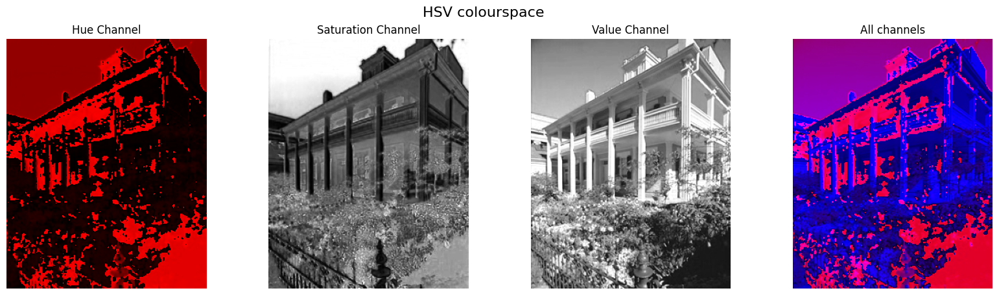

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-75.741516..255.0].


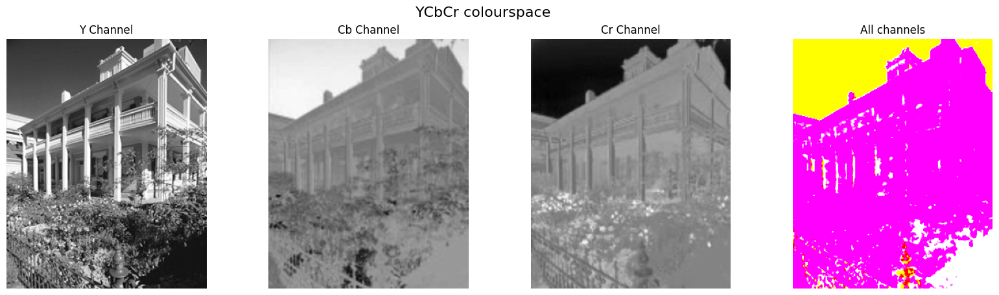

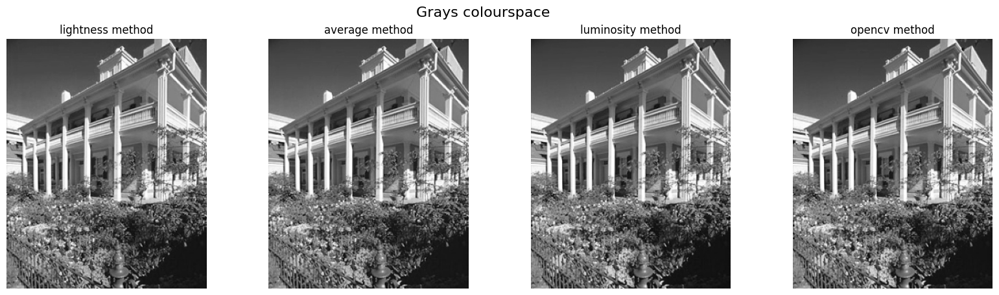

In [143]:
# Load and convert the image to RGB
image = cv2.imread('images/beehive_house.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
visualize_colourspace(image, 'rgb')

choices = ['opponent', 'nrgb', 'hsv', 'ycbcr', 'grays']
for colours_space_choice in choices:
    visualize_colourspace(convert_colour_space(image, colours_space_choice), colourspace=colours_space_choice)

<a id="question-4"></a>
#### <font color='#FF0000'>Question 4 (2 points)</font>

Explain each of the above 5 colour spaces and their properties. What are the benefits of using a different colour space other than RGB? Provide reasons for each of the above cases. You can include your observations from the visualizations.

##### <font color='yellow'>Answer:</font>

> ***Note:***
> The descriptions of Opponent, nRGB and HSV colour spaces as well as their benefits follow the explanations given by K. van de Sande et al. [2].
> 
> - ***Opponent***:
>   - Description:
>     - The channels O1 and O2 contain the color information. Channel O3 contains information about the intensity [2].
>   - Benefits:
>     - Channels O1 and O2 are invariant to shifts in light intensity [2].
> 
> - ***nRGB***:
>     - Description:
>       - The channels r and g describe the color information. Channel b is redundant as r + g + b = 1. [2]
>     - Benefits:
>       - The normalization makes the chanells r and g invariant to light intensity changes, shadows and shading [2].
>       - It can be applied in cases when an algorithm needs to affect the value of an image, but not saturation or hue. [4]
> 
> - ***HSV***:
>   - Description:
>     - H stands for Hue, S stands for Saturation, V stands for Value. It can be intuitevly understood as H being responsible for shifts in type of color, S for shifts in intensity (saturation) of the color and V for shifts in brightness of the color [2]
>   - Benefits:
>     - Since the separate channel values can be intuitevly understood, the HSV colour space is commonly used in color pickers and image editing software.
>     - As Koen van de Sande et. al. note, the H and S channels are scale-invariant and shift-invariant with respect to light intensity [2]. Therefore changes in light intensity, such as shadows, do not affect the HSV colourspace as much as the other colourspaces. This makes the HSV colour space suitable for tasks such as edge detection in images which contain shadows, as seen in the example provided by Setchell [3]. 
> 
> - ***YCbCr***:
>   - Description:
>     - Szeliski explains that the chroma channels Cb and Cr carry the blue and red color difference signals. Channel Y is the luma channel, which is designed to mimic true luminance [4].
>   - Benefits:
>     - Separating out the luma and using the remaining two channels to represent color makes it possible to perform chroma subsampling, which reduces the bandwith without significant visual difference [5].
> 
> - ***Grays***:
>   - Description:
>     - Grayscale colour space consists of a single channel which contains only intensity information.
>   - Benefits:
>     - Grayscale is widely applicable in tasks which do not require color information. Because it has only a single channel, grayscale requires less memory and computational resources.

<a id="question-5"></a>
#### <font color='#FF0000'>Question 5 (1 point)</font>

Find one more colour space from the literature, briefly explain its properties and give a use case.

##### <font color='yellow'>Answer:</font>

> K. van de Sande et al. [2] describe the *transformed color distribution* as
> $$
> \begin{pmatrix}
>    R' \\
>    G' \\
>    B'
> \end{pmatrix}
> =
> \begin{pmatrix}
>    \frac{R - \mu_R}{\sigma_R} \\
>    \frac{G - \mu_G}{\sigma_G} \\
>    \frac{B - \mu_B}{\sigma_B}
> \end{pmatrix}
> $$
> 
> 
> with $\mu_C$ the mean and $\sigma_C$ the standard deviation of the distribution in channel $C$.
> 
> Because each of the channel gets normalized independently, the whole colour space is invariant to changes and shifts in light intensity > as well light color changes and shifts. K. van de Sande et al. state that the aformentioned invariances positively influences image > classification (categorization).

<a id="section-2"></a>
### **Section 2: Colour Constancy**

Colour constancy is the ability to perceive the colors of objects consistently, regardless of the color of the light source. The goal of color constancy algorithms is to estimate the light source's illuminant and then correct the image so that it appears as if taken under a canonical (white) light source. In digital cameras, the automatic white balance (AWB) function performs this task to ensure images look natural.

In this part of the assignment, you will implement the well-known Grey-World Algorithm, a fundamental color constancy algorithm. This algorithm operates under the assumption that, under white light, the average color in a scene should be grey ([128, 128, 128]).

For more information, refer to the [Grey World algorithm on Wikipedia.](https://en.wikipedia.org/wiki/Color_normalization#Grey_world)

<a id="question-6"></a>
#### <font color='#FF0000'>Question 6 (8 points)</font>

Complete the function `apply_grey_world_algorithm` to apply color correction to an RGB image using the Grey-World algorithm.

Display the original image and the color-corrected one on the same figure. Use the `beehive_house.jpg` image to test your algorithm. You should see that the reddish color cast on the image is removed, making it look more natural.

***Note:*** You do not need to apply any pre or post-processing steps. For the calculation or processing, you are not allowed to use any available code or any dedicated library function except *standard Numpy functions*.

In [144]:
def apply_grey_world_algorithm(awb_img):
    """
    Apply the Grey-World algorithm to correct the color balance of an RGB image.

    This function assumes that under a white light source, the average color in a scene should be grey.
    It corrects the image by scaling each channel so that the mean of each channel is equal.

    Args:
        awb_img: RGB image to be color corrected

    Returns:
        gw_img: Color corrected image using the Grey-World algorithm
    """
    # Images are represented as uint8, for channels to have values in [0, 255]
    # to do scalar operations, this precision is not suited, so we need to convert to float32 first
    awb_img = awb_img.astype(np.float32)

    # Compute the average value for each channel
    red_mean = np.mean(awb_img[:, :, 0])
    green_mean = np.mean(awb_img[:, :, 1])
    blue_mean = np.mean(awb_img[:, :, 2])

    # Compute the average for the entire image
    image_mean = (red_mean + green_mean + blue_mean) / 3

    # Compute the scaling factors for each channel
    red_scale = image_mean / red_mean
    green_scale = image_mean / green_mean
    blue_scale = image_mean / blue_mean

    # Scale each channel with the corresponding scaling factor
    gw_img = awb_img.copy()
    gw_img[:, :, 0] = gw_img[:, :, 0] * red_scale
    gw_img[:, :, 1] = gw_img[:, :, 1] * green_scale
    gw_img[:, :, 2] = gw_img[:, :, 2] * blue_scale

    # Clipping the values to be in the range [0, 255] as a usual image and converting back to uint8
    gw_img = np.clip(gw_img, 0, 255).astype(np.uint8)

    return gw_img

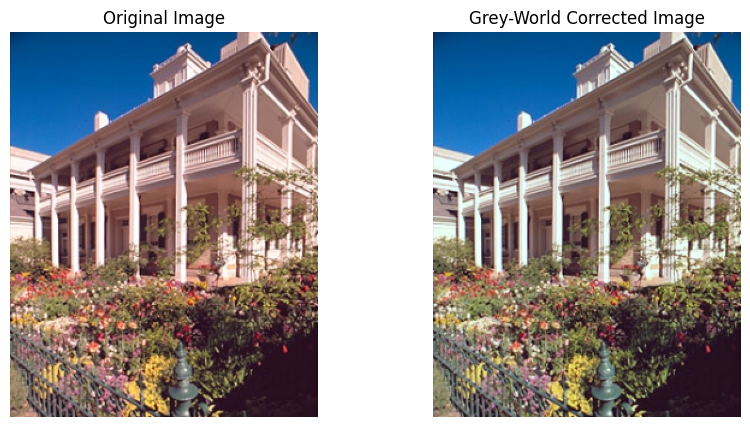

In [145]:
# load and convert the image to rgb
image = cv2.imread('images/beehive_house.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# grey-world algorithm
gw_corrected_image = apply_grey_world_algorithm(image)

# Visualize the results side by side 
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(gw_corrected_image)
plt.title('Grey-World Corrected Image')
plt.axis('off')

plt.show()

<a id="question-7"></a>
#### <font color='#FF0000'>Question 7 (2 points)</font>

Give an example case for Grey-World Algorithm on where it might fail. Include your reasoning.

##### <font color='yellow'>Answer:</font>

> The Grey-World Algorithm fails, for example, in a image that has a dominant colour, since the assumption that the mean of the image should be gray ($\mu_{red} = \mu_{green} = \mu_{blue}$) would not hold true.
>
> In simple terms, imagine a picture of the ocean, where the sky is blue and the ocean is also blue. The values of the blue channel will be way higher than the values of the other channels. When the Algorithm calculates the scaling factor for Red and Green channels, the values will be very high, since we are dividing by the average of those channels, which are very low. This will result in a very high scaling factor for red and green and a very low scaling factor for blue. This will give a very accentuated change of colour in the image, making it look very unnatural: the ocean, in this case, will look very green/red.
>
> ```Resources```: https://craftofcoding.wordpress.com/wp-content/uploads/2018/08/pracn6_whitebal.pdf

<a id="question-8"></a>
#### <font color='#FF0000'>Question 8 (3 points)</font>

Find out one more colour constancy algorithm from the literature and explain it briefly.

##### <font color='yellow'>Answer:</font>

> One other colour constancy algorithm is the **Single Scale Retinex Algorithm**. 
> 
> The [Retinex Theory](https://www.semanticscholar.org/paper/Lightness-and-retinex-theory.-Land-McCann/a2f9c78b094ccd50cbb175193d2993735d39c6a6) is a theory that explains how the human visual system perceives the lightness of an object and it has 3 main assumptions:
> - The colour we perceive is the result of the interaction between light and the object. Hence, the colour dependes on the reflectance of the object and not on the colour of the light illuminating it.
> - The perceived colour of a region is determined by comparing it to the surrounding regions and the global scene.
> - The colour perception is based on the wavelength of the light, and can be divided into 3 channels: red, green and blue, corresponding to long, medium and short wavelengths.
> 
> Given this, the **Single Scale Retinex Algorithm** main goal is to separate the illumination from the reflectance of the image. It does this by applying, for example, a Gaussian filter to the image, which gives us an approximation of the illumination, and then dividing the original image by the filtered image. This way, the illumination is removed from the image, and the reflectance is isolated. Since we are more sensitive to relative changes in light than to absolute changes, the algorithm applies a logarithm to the image, which makes the image look more natural.
> 
> $$
> R( x, y ) = log( I( x, y ) ) - log( G(x, y) * I(x, y) )
> $$
> 
> Where $R$ is the reflectance, $I$ is the original image and $G$ is a function that smooths the image. We can use a Gaussian filter to blur the image for $G$, because it is a good approximation of the illumination of the image and accounts for the assumption that it is influenced by the surrounding regions.
> 
> ```Resources```:
> - Land, Edwin Herbert and John J. McCann. “Lightness and retinex theory.” Journal of the Optical Society of America 61 1 (1971): 1-11 .
> - https://santhalakshminarayana.github.io/blog/retinex-image-enhancement

<a id="section-3"></a>
### **Section 3: Intrinsic Image Decomposition**

Intrinsic image decomposition is the process of separating an image into its formation components, such as reflectance (albedo) and shading (illumination). <a name="cite_ref-1"></a>[<sup>[1]</sup>](#cite_note-1) Then, under the assumptions of body (diffuse) reflection, linear sensor response and narrow band filters, the decomposition of the observed image $I(\vec{x})$ at position $\vec{x}$ can be approximated as the element-wise product of its albedo $R(\vec{x})$ and shading $S(\vec{x})$ intrinsics:

$$I(\vec{x})=R(\vec{x}) \times S(\vec{x})$$

In this part of the assignment, you will experiment with intrinsic image components to perform a particular computational photography application: material recolouring. For the experiments, we will use images from a synthetic intrinsic image dataset. <a name="cite_ref-2"></a>[<sup>[2]</sup>](#cite_note-2)

<a name="cite_note-1"></a><small>[1.](#cite_ref-1) H. G. Barrow and J. M. Tenenbaum. Recovering intrinsic scene characteristics from images. Computer Vision Systems, pages 3-26, 1978.</small>

<a name="cite_note-2"></a><small>[2.](#cite_ref-1) http://www.cic.uab.cat/Datasets/synthetic_intrinsic_image_dataset/


<a id="question-9"></a>
#### <font color='#FF0000'>Question 9 (2 points)</font>

In what other components can an image be decomposed other than albedo and shading? Give an example and explain the concepts in your answer.

##### <font color='yellow'>Answer:</font>

> Images can be decomposed into *distance* and *orientation* as well. \
The distance decomposition provides the range of visible points, along the line of sight, of the original image. \
The orientation decomposition presents a normal vector denoting the direction of the surface at each point.

<a id="question-10"></a>
#### <font color='#FF0000'>Question 10 (2 points)</font>

If you check the literature, you will see that almost all intrinsic image decomposition datasets are composed of synthetic images. What might be the reason for that?

##### <font color='yellow'>Answer:</font>

>The presented synthetic images are relatively simple whilst real-world images tend to be rather complex. \
As a result of this simple nature, the decomposed images are more likely to be clear and intuitive.

<a id="question-11"></a>
#### <font color='#FF0000'>Question 11 (4 points)</font>

Choose an object with a single color from the `/intrinsic_images/` folder, which is based on the [synthetic intrinsic image dataset](http://www.cic.uab.cat/Datasets/synthetic_intrinsic_image_dataset/).

Demonstrate that you can reconstruct the original PNG image from its intrinsics using the albedo and shading. Your script should output a figure displaying the original image, its intrinsic images, and the reconstructed one. Complete the function `reconstruct_image_from_intrinsics()`.


In [146]:
def reconstruct_image_from_intrinsics(albedo_img, shading_img):
    """
    Reconstruct the original image from its intrinsic images (albedo and shading).

    This function takes the albedo and shading images as input, 
    and reconstructs the original image by multiplying albedo with shading.

    Args:
        albedo_img: Image representing the albedo (reflectance)
        shading_img: Image representing the shading

    Returns:
        iid_img: Reconstructed image
    """
    iid_img = cv2.multiply(albedo_img/255, shading_img/255)

    return iid_img

object shape: (266, 480, 3)
object albedo shape: (266, 480, 3)
object shading shape: (266, 480, 3)


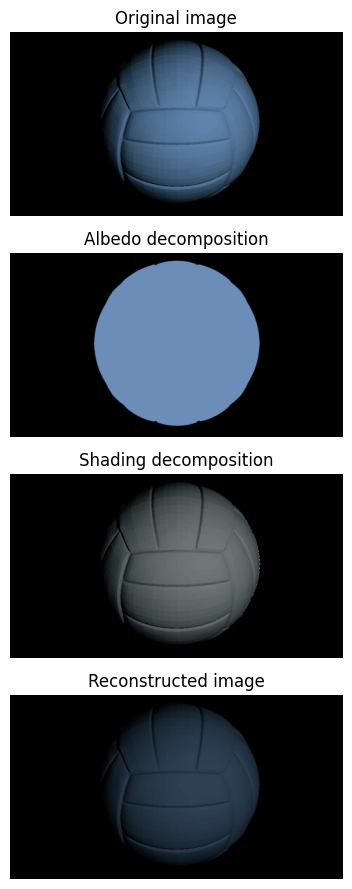

In [147]:
# Replace the object name with a valid name from the dataset
img_path = './intrinsic_images/'
object_name = 'ball_dl'

# Read with opencv
obj = cv2.imread(img_path + object_name + '.png')
if obj is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name + ".png"}')
else:
    print(f'object shape: {obj.shape}')

obj_sha = cv2.imread(img_path + object_name + '_shad.png')
if obj_sha is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name + "_shad.png"}')
else:
    print(f'object albedo shape: {obj_sha.shape}')

obj_alb = cv2.imread(img_path + object_name.split('_')[0] + '_refl.png')
if obj_alb is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name.split("_")[0] + "_refl.png"}')
else:
    print(f'object shading shape: {obj_alb.shape}')

fig, axes = plt.subplots(4, figsize=(7, 11))
obj_rec = reconstruct_image_from_intrinsics(obj_alb, obj_sha)

axes[0].imshow(obj)
axes[0].set_title("Original image")
axes[0].axis('off')

axes[1].imshow(obj_alb)
axes[1].set_title("Albedo decomposition")
axes[1].axis('off')

axes[2].imshow(obj_sha)
axes[2].set_title("Shading decomposition")
axes[2].axis('off')

axes[3].imshow(obj_rec)
axes[3].set_title("Reconstructed image")
axes[3].axis('off')

plt.show()

<a id="question-12"></a>
#### <font color='#FF0000'>Question 12 (2 points)</font>

Manipulating colors in photographs is an important problem with many applications in computer vision. Recoloring algorithms aim to manipulate colors effectively, and better results can be obtained if the albedo image is available as it is independent of confounding illumination effects.

First determine the true material color of the object you picked in RGB space (uniform color in this case). 

- Complete the code for the function `get_true_color()`.
- Plot the true color of the object in RGB space, make sure to also plot each channel separately. 

**Hint:** You can use `np.tile` to create a visualization of the true color.

In [148]:
def get_true_color(albedo_img):
    """
    Determines the true material color of the object in the albedo image.

    This function calculates the average RGB color in the albedo image, which represents the true material color of the object.

    Args:
        albedo_img: Albedo (reflectance) image

    Returns:
        true_colour: True material color of the object in RGB space
    """

    true_colour = np.zeros((3))
    true_colour[0] = np.mean(albedo_img[:,:,0])
    true_colour[1] = np.mean(albedo_img[:,:,1])
    true_colour[2] = np.mean(albedo_img[:,:,2])

    return true_colour

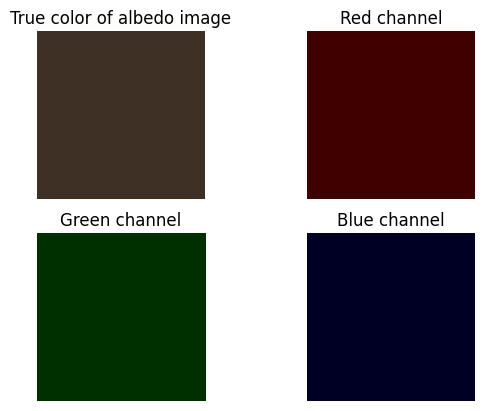

In [149]:
# get the true color of the object's albedo image
obj_alb_rgb = cv2.cvtColor(obj_alb, cv2.COLOR_BGR2RGB)
true_color = get_true_color(obj_alb_rgb)

fig, ax = plt.subplots(2,2)
true_color_plot = np.tile(true_color.reshape((1,1,3)), (100, 100, 1))

# Plot albedo image
ax[0, 0].imshow(true_color_plot/255)
ax[0, 0].set_title("True color of albedo image")
ax[0, 0].axis('off')

# Define and plot red channel
red_channel = np.zeros((100,100,3))
red_channel[:, :, 0] = true_color_plot[:, :, 0]
ax[0, 1].imshow(red_channel/255)
ax[0, 1].set_title("Red channel")
ax[0, 1].axis('off')

# Define and plot green channel
green_channel = np.zeros((100,100,3))
green_channel[:, :, 1] = true_color_plot[:, :, 1]
ax[1, 0].imshow(green_channel/255)
ax[1, 0].set_title("Green channel")
ax[1, 0].axis('off')

# Define and plot blue channel
blue_channel = np.zeros((100,100,3))
blue_channel[:, :, 2] = true_color_plot[:, :, 2]
ax[1, 1].imshow(blue_channel/255)
ax[1, 1].set_title("Blue channel")
ax[1, 1].axis('off')

plt.show()

<a id="question-13"></a>
#### <font color='#FF0000'>Question 13 (2 points)</font>

Assume you are given the PNG image and have access to its intrinsic albedo and shading images.

Recolor the object's image with pure red (255, 0, 0). Complete the code for the function `recolor_image()`. Display the recolored version of the object. Make sure to also plot each channel separately.

In [150]:
def recolor_image(albedo_img, shading_img):
    """
    Recolors an image based on its albedo and shading images.

    This function recolors the input albedo image by changing non-black pixels to red
    and then reconstructs the final image using the provided shading image.

    Args:
        albedo_img: Albedo (reflectance) image
        shading_img: Shading image

    Returns:
        recolored_img: Recolored and reconstructed image
    """

    albedo_img_new = albedo_img.copy()
    albedo_img_new[:, :, 0] = (np.sum(albedo_img_new, axis=2) > 0).astype(int) * 255
    albedo_img_new[:, :, 1] = 0
    albedo_img_new[:, :, 2] = 0
    
    recolored_img = reconstruct_image_from_intrinsics(albedo_img_new, shading_img)

    return recolored_img

(-0.5, 479.5, 265.5, -0.5)

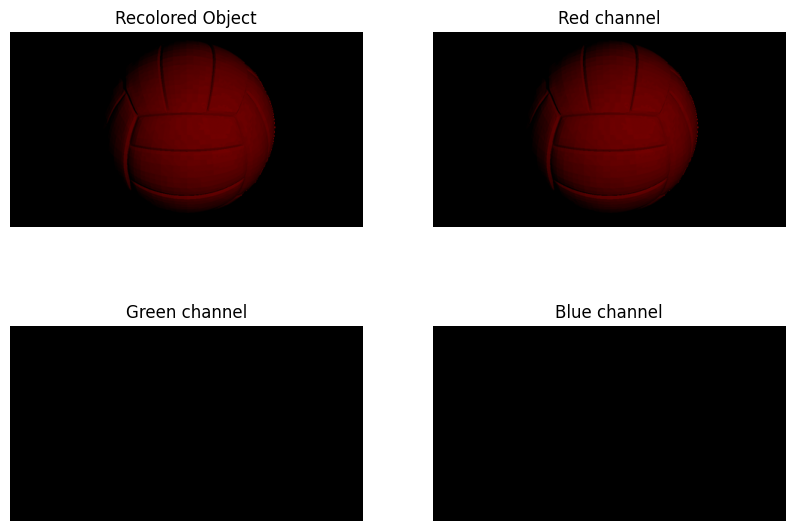

In [151]:
recolored_image = recolor_image(obj_alb, obj_sha)

fig, ax = plt.subplots(2,2, figsize=(10, 7))

# Plot recolored object
ax[0,0].imshow(recolored_image)
ax[0,0].set_title("Recolored Object")
ax[0,0].axis('off')

# Define zeros mold
zeros_recolored = np.zeros((recolored_image.shape[0], recolored_image.shape[1], 3))

# Define and plot red channel
red_channel1 = zeros_recolored.copy()
red_channel1[:, :, 0] = recolored_image[:, :, 0]
ax[0, 1].imshow(red_channel1)
ax[0, 1].set_title("Red channel")
ax[0, 1].axis('off')

# Define and plot green channel
green_channel1 = zeros_recolored.copy()
green_channel1[:, :, 1] = recolored_image[:, :, 1]
ax[1, 0].imshow(green_channel1)
ax[1, 0].set_title("Green channel")
ax[1, 0].axis('off')

# Define and plot blue channel
blue_channel1 = zeros_recolored.copy()
blue_channel1[:, :, 2] = recolored_image[:, :, 2]
ax[1, 1].imshow(blue_channel1)
ax[1, 1].set_title("Blue channel")
ax[1, 1].axis('off')

<a id="question-14"></a>
#### <font color='#FF0000'>Question 14 (2 points)</font>

Although you have recoloured the object with pure red, the reconstructed images do not seem to display those pure colors and thus the colour distributions over the object do not appear uniform. Explain the reason.

##### <font color='yellow'>Answer:</font>

> The image is reconstructed based on the illumination and orientation. As a result, the reconstruced image has got a variety, and thus a non-uniform distribution, of intensity values for the color red.

__Note:__  This was a simple case where the image is synthetic, object centered and has only one colour, and you have access to its ground-truth intrinsic images. Real world scenarios require more than just replacing a single colour with another, not to mention the complexity of achieving a decent intrinsic image decomposition.

<a id="section-4"></a>
### **Section 4: Photometric Stereo**

In this section, we delve into the photometric stereo technique, a method used to reconstruct a surface's shape from a set of images captured under varying lighting conditions. This approach is based on the principles outlined in Section 5.4 of Forsyth and Ponce's *Computer Vision: A Modern Approach*, which provides a comprehensive introduction to the theory and application of photometric stereo in computer vision.

Photometric stereo is particularly useful for capturing fine details of surface geometry. The core idea is to utilize an orthographic camera to take multiple images of a surface, each under different lighting conditions. By analyzing the variations in image intensity across these images, we can infer the surface normals and, subsequently, reconstruct the surface's height at each pixel, leading to what is commonly known as a height map or depth map.

The method assumes that the camera and the surface remain stationary, with illumination coming from different directions. By capturing enough images with different light source vectors, we can solve for the surface normals and albedo at each pixel.

<a id="question-15"></a>
#### <font color='#FF0000'>Question 15 (4 points)</font>

Start with the grayscale sphere model located in the SphereGray5 folder. The folder contains 5 images of a sphere with a grayscale checker texture under different lighting conditions. Your task is to estimate the surface reflectance (albedo) and surface normal of this model.

In this question, you will need to complete the function `estimate_albedo_and_normals()` to estimate the albedo and surface normal map for the SphereGray5 folder.

To assist you, two helper functions are provided:

- `load_synthetic_images()`: This function loads the synthetic images from the specified directory.
- `show_results()`: This function displays the albedo, surface normals, and optionally the height map and surface error.

These helper functions are provided to simplify the process of loading images and displaying your results.

**Hint**: To get the least-squares solution of a linear system, you can use the `numpy.linalg.lstsq` function.

Make sure to include images of your results in your notebook at key points. When visualizing 3D models, choose viewpoints that clearly illustrate the structure, and feel free to use multiple viewpoints if necessary.

In [152]:
def load_synthetic_images(image_dir='./photometrics_images/SphereGray5/', channel=0):
    """
    Loads synthetic images and their corresponding light source directions.

    This function reads all images from the specified directory, extracts the relevant channel, and stacks the images along the third dimension. 
    It also extracts the light source directions from the image filenames and normalizes both the image stack and the light source vectors.

    Args:
        image_dir: directory containing the synthetic images
        channel: color channel to be extracted (default is 0, corresponding to the red channel)

    Returns:
        image_stack: a 3d numpy array of stacked images
        normalized_light_dirs: a 2d numpy array of normalized light source directions
    """
    # list all files in the image directory
    image_files = os.listdir(image_dir)
    num_images = len(image_files)

    image_stack = None
    light_directions = None
    
    # assumed z component for the light direction
    z_component = 0.5  

    # loop through all image files
    for i in range(num_images):
        # read the input image
        image = cv2.imread(os.path.join(image_dir, image_files[i]))
        image = np.flip(image, axis=-1)  # flip the image to correct the channel order
        image = image[:, :, channel]  # extract the specified color channel

        # initialize image stack and light direction array on the first iteration
        if image_stack is None:
            height, width = image.shape
            print('image size (h*w): %d*%d' % (height, width))
            image_stack = np.zeros([height, width, num_images], dtype=int)
            light_directions = np.zeros([num_images, 3], dtype=np.float64)

        # stack the image along the third dimension
        image_stack[:, :, i] = image

        # extract light direction from the image filename
        x_component = np.double(image_files[i][(image_files[i].find('_') + 1):image_files[i].rfind('_')])
        y_component = np.double(image_files[i][image_files[i].rfind('_') + 1:image_files[i].rfind('.png')])
        light_directions[i, :] = [x_component, -y_component, z_component]

    # convert the image stack to double precision for further processing
    image_stack = np.double(image_stack)

    # normalize the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)

    # handle the case where all pixel values are the same
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  

    # normalize the light direction vectors
    norm_factors = np.tile(np.sqrt(np.sum(light_directions ** 2, axis=1, keepdims=True)), (1, light_directions.shape[1]))
    normalized_light_dirs = light_directions / norm_factors

    return image_stack, normalized_light_dirs

In [153]:
def show_results(albedo, normals, height_map=None, SE=None, show_normals=False, show_normals_3D=False):
    """
    Displays the albedo, normals, and optionally the height map and surface error (SE).

    Args:
        albedo: albedo (reflectance) map
        normals: surface normal map
        height_map: reconstructed height map (optional)
        SE: surface error map (optional)
    """
    # stride in the plot, you may want to adjust it to different images
    stride = 1

    if albedo is not None:
        # showing albedo map
        fig = plt.figure(figsize=(5, 5))
        albedo_max = 1  # normalize albedo values
        albedo = albedo / albedo_max
        print("Albedo shape:", albedo.shape)
        plt.imshow(albedo, cmap="gray")
        plt.title('Albedo Map', fontsize=16)
        plt.show()

    # showing normals as three separate channels
    figure = plt.figure(figsize=(10, 10))
    ax1 = figure.add_subplot(221)
    ax1.imshow(normals[..., 0], vmin=-1, vmax=1, cmap='viridis')
    ax1.set_axis_off()
    ax1.set_title('Normal Channel x', fontsize=16)
    ax2 = figure.add_subplot(222)
    ax2.imshow(normals[..., 1], vmin=-1, vmax=1, cmap='viridis')
    ax2.set_axis_off()
    ax2.set_title('Normal Channel y', fontsize=16)
    ax3 = figure.add_subplot(223)
    ax3.imshow(normals[..., 2], vmin=-1, vmax=1, cmap='viridis')
    ax3.set_axis_off()
    ax3.set_title('Normal Channel z', fontsize=16)
    ax4 = figure.add_subplot(224)
    ax4.imshow((normals + 1) * 0.5)
    if show_normals:
        # Add the normals on top of the image
        subsample_stride = 20
        ax4.quiver(np.arange(0, normals.shape[1], subsample_stride),
                   np.arange(0, normals.shape[0], subsample_stride),
                   normals[::subsample_stride, ::subsample_stride, 0],
                   normals[::subsample_stride, ::subsample_stride, 1],
                   color='g')
    ax4.set_axis_off()
    ax4.set_title('Combined Normals', fontsize=16)
    plt.show()

    # Create meshgrid for plotting 3D surfaces
    X, Y, _ = np.meshgrid(np.arange(0, np.shape(normals)[0], stride),
                          np.arange(0, np.shape(normals)[1], stride),
                          np.arange(1))
    X = X[..., 0]
    Y = Y[..., 0]

    # Show both heightmap and SE in a 1x2 subplot if they're available
    if height_map is not None and SE is not None:
        fig = plt.figure(figsize=(8, 4))

        # Show heightmap
        ax1 = fig.add_subplot(1, 2, 1, projection='3d')
        H_height_map = height_map[::stride, ::stride]
        ax1.plot_surface(X, Y, H_height_map.T)
        ax1.set_title("Height Map")

        # Show SE
        ax2 = fig.add_subplot(1, 2, 2, projection='3d')
        H_SE = SE[::stride, ::stride]
        ax2.plot_surface(X, Y, H_SE.T, color='r')
        ax2.set_title("SE")

        plt.tight_layout()
        plt.show()

        if show_normals_3D:
            # Add the normals to a 3D plot using quiver
            fig = plt.figure()
            ax = fig.add_subplot(111, projection='3d')
            subsample_stride = 20
            ax.quiver(X[::subsample_stride, ::subsample_stride], 
                    Y[::subsample_stride, ::subsample_stride], 
                    height_map[::subsample_stride, ::subsample_stride],
                    normals[::subsample_stride, ::subsample_stride, 0].T,
                    normals[::subsample_stride, ::subsample_stride, 1].T,
                    normals[::subsample_stride, ::subsample_stride, 2].T,
                    length=10,
                    color='r')
            ax.set_title("Normals in Height Map")
            plt.show()

    # Only show heightmap if it's available
    elif height_map is not None:
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')
        H_height_map = height_map[::stride, ::stride]
        ax.plot_surface(X, Y, H_height_map.T)
        ax.set_title("Height Map")
        plt.show()

    # Only show SE if it's available
    elif SE is not None:
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')
        H_SE = SE[::stride, ::stride]
        ax.plot_surface(X, Y, H_SE.T, color='r')
        ax.set_title("SE")
        plt.show()

Following the guidelines in *Computer Vision: A Modern Approach* by Forsyth and Ponce, Chapter 5, Section 5.4, you will complete the `estimate_albedo_and_normals()` function by implementing the following steps:

1. **Iterate through each point in the image array**:
   - For each pixel, extract the intensity values across all images and stack them into a vector `i`.

2. **Construct the diagonal matrix**:
   - Construct the diagonal matrix `scriptI` using the vector `i`.

3. **Solve the linear system**:
   - Solve the equation `scriptI * scriptV * g = scriptI * i` to obtain the vector `g` for each pixel.

4. **Compute the albedo**:
   - The albedo at each pixel is the magnitude (norm) of the vector `g`, denoted as `|g|`.

5. **Compute the surface normal**:
   - The surface normal at each pixel is given by `g / |g|`, where `|g|` is non-zero.

In [154]:
def estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=True):
    """
    Estimates the surface albedo and normals from a stack of images.

    This function computes the albedo and surface normals for each pixel in the 
    image stack using the provided light source directions. Optionally, it applies 
    the shadow trick to improve the robustness of the solution.

    Args:
        image_stack: The stack of images of the surface, stacked along the third dimension.
        scriptV: The matrix containing the source and camera information.
        shadow_trick: Boolean indicating whether to use the shadow trick (default is True).

    Returns:
        albedo: The estimated surface albedo.
        normal: The estimated surface normals.
    """

    h, w, _ = image_stack.shape

    # create arrays for the albedo and normals
    albedo = np.zeros([h, w])
    normal = np.zeros([h, w, 3])

    for i in range(h):
        for j in range(w):
            # Transform vector vector i into diagonal matrix scriptI
            V_i = image_stack[i,j]
            scriptI = np.diag(image_stack[i,j])
    
            # Determine g using least squares with shadow trick condition
            g = None
            if shadow_trick:
                g = np.linalg.lstsq(scriptI @ scriptV, scriptI @ V_i, rcond=-1)[0]
            else:
                g = np.linalg.lstsq(scriptV, V_i, rcond=-1)[0]
            
            # Compute albedo and surface normal at coordinates i,j
            g_norm = np.linalg.norm(g)
            albedo[i,j] = g_norm.copy()
            normal[i,j] = g / g_norm if g_norm != 0 else 0

    return albedo, normal

image size (h*w): 512*512
Albedo shape: (512, 512)


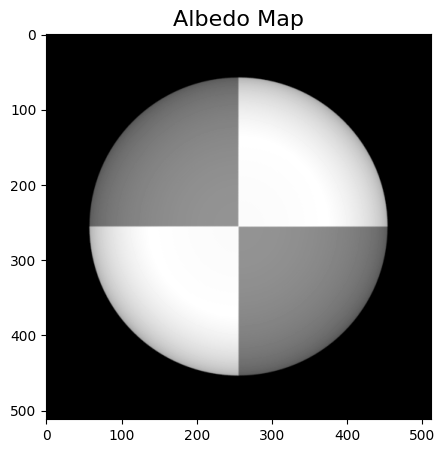

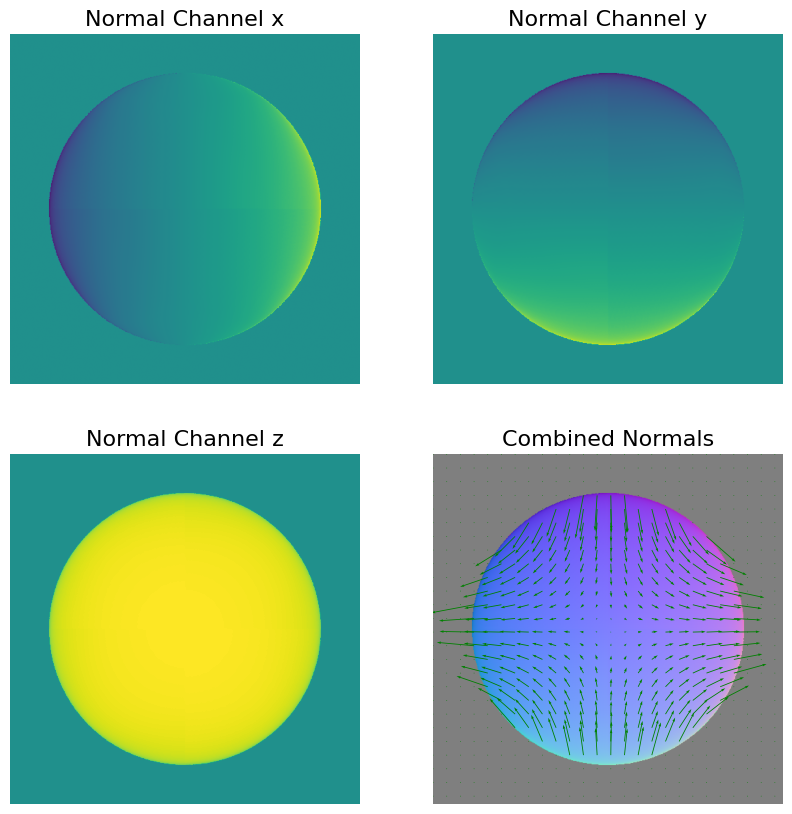

In [155]:
# load synthetic images for SphereGray5
image_stack_5, normalized_light_dirs_5 = load_synthetic_images('./photometrics_images/SphereGray5/')

# estimate albedo and normals
albedo_5, normals_s5 = estimate_albedo_and_normals(image_stack_5, normalized_light_dirs_5)

# show results
show_results(albedo_5, normals_s5, show_normals=True)

Albedo shape: (512, 512)


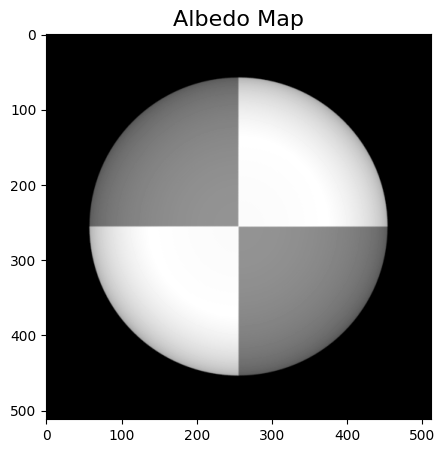

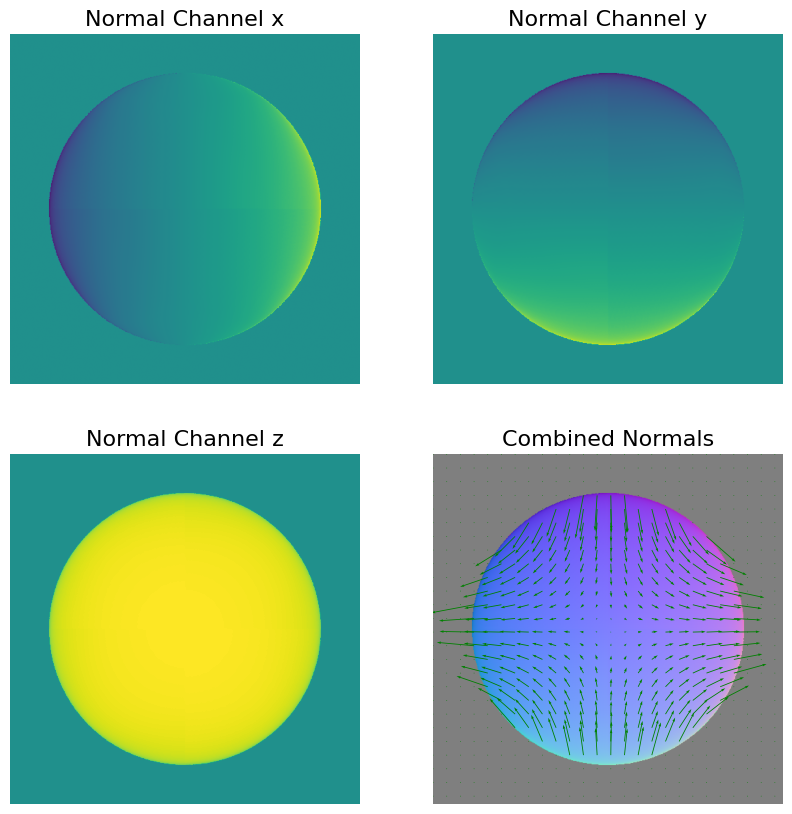

In [156]:
show_results(albedo_5, normals_s5, show_normals=True)

<a id="question-16"></a>
#### <font color='#FF0000'>Question 16 (2 points)</font>

After implementing the `estimate_albedo_and_normals()` function, what do you expect to see in the albedo image? How does this compare to your actual result? Explain the differences.

##### <font color='yellow'>Answer:</font>

> An albedo image displays the pure colours of its orignal image. Therefore, the expected albedo image, after implementing the ```estimate_albedo_and_normals()``` function, should present the sphere with a pure white and grey colour in its corresponding sections. \
The resulting albedo image mostly satisfies this condition since most of the sphere's surface appears to show its pure colours. However, the edges of the elipse appear to show some impurity resembling a remaining shadow which is likely an imperfection due to lack of proper data. 

<a id="question-17"></a>
#### <font color='#FF0000'>Question 17 (1 point)</font>

In principle, what is the minimum number of images you need to estimate the albedo and surface normal? Explain your reasoning.

##### <font color='yellow'>Answer:</font>

> The equation contains three unknown variables: normal channel x, y and z. Therefore, the minimum amount of images required to estimate these variables is three.

<a id="question-18"></a>
#### <font color='#FF0000'>Question 18 (2 points)</font>

Now, run the algorithm with more images by using the SphereGray25 folder. Observe the differences in the results when using more images. Report your findings. 

You could try all images at once or a few at a time, incrementally. Choose a strategy and justify it by discussing your results.

image size (h*w): 512*512
Albedo shape: (512, 512)


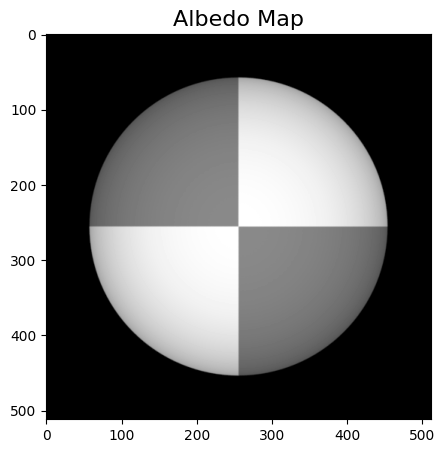

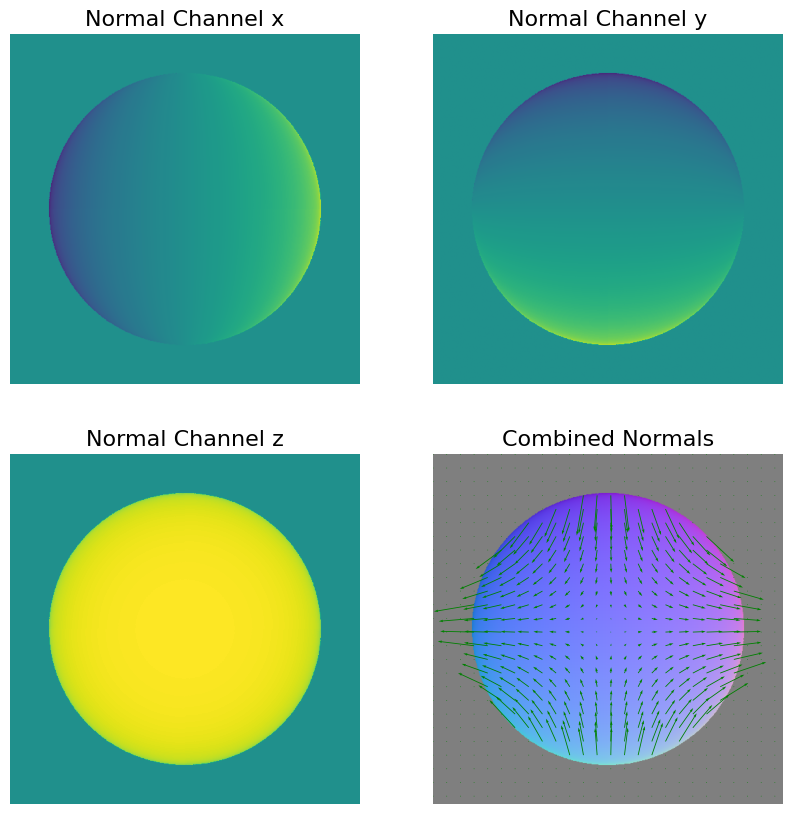

In [157]:
# load synthetic images for SphereGray25
image_stack_25, normalized_light_dirs_25 = load_synthetic_images('./photometrics_images/SphereGray25/')

# estimate albedo and normals for SphereGray25
albedo_25, normals_s25 = estimate_albedo_and_normals(image_stack_25, normalized_light_dirs_25)

# show the results for SphereGray25
show_results(albedo_25, normals_s25, show_normals=True)

Albedo shape: (512, 512)


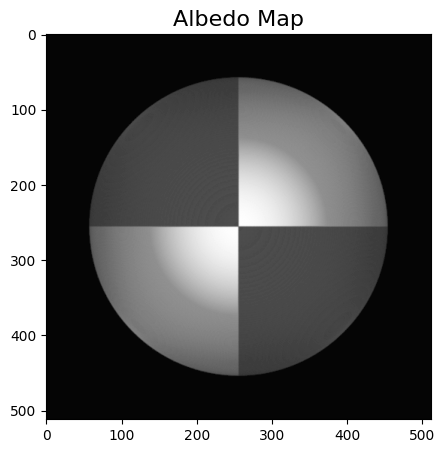

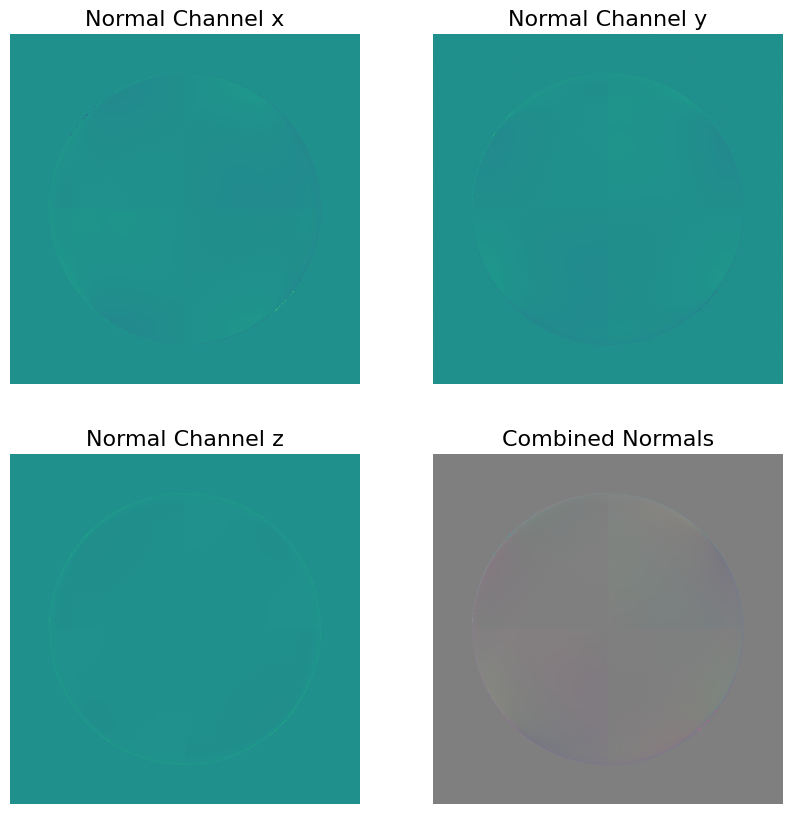

In [158]:
show_results((albedo_25 - albedo_5), (normals_s25 - normals_s5))

##### <font color='yellow'>Answer:</font>

> The current implementation of ``estimate_albedo_and_normals`` shows little to no difference to the naked eye when comparing the results of the ``SphereGray5`` and ``SphereGray25`` folder. Nevertheless, the results of ``SphereGray25`` showed more contours and pure colours when subtracted by the results of ``SphereGray5``.

<a id="question-19"></a>
#### <font color='#FF0000'>Question 19 (2 points)</font>

Consider the impact of shadows in photometric stereo. Explain the trick mentioned in the textbook to deal with shadows.

Remove this trick from your implementation and check your results. Is the trick necessary when using 5 images? How about when using 25 images?

Albedo shape: (512, 512)


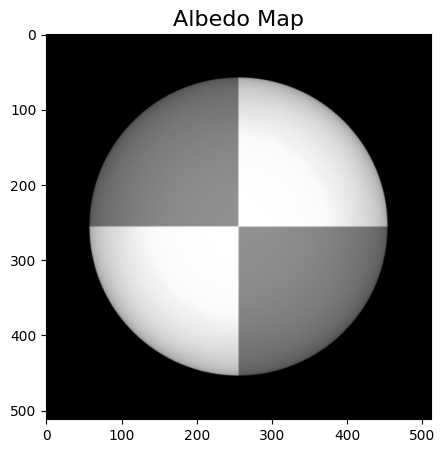

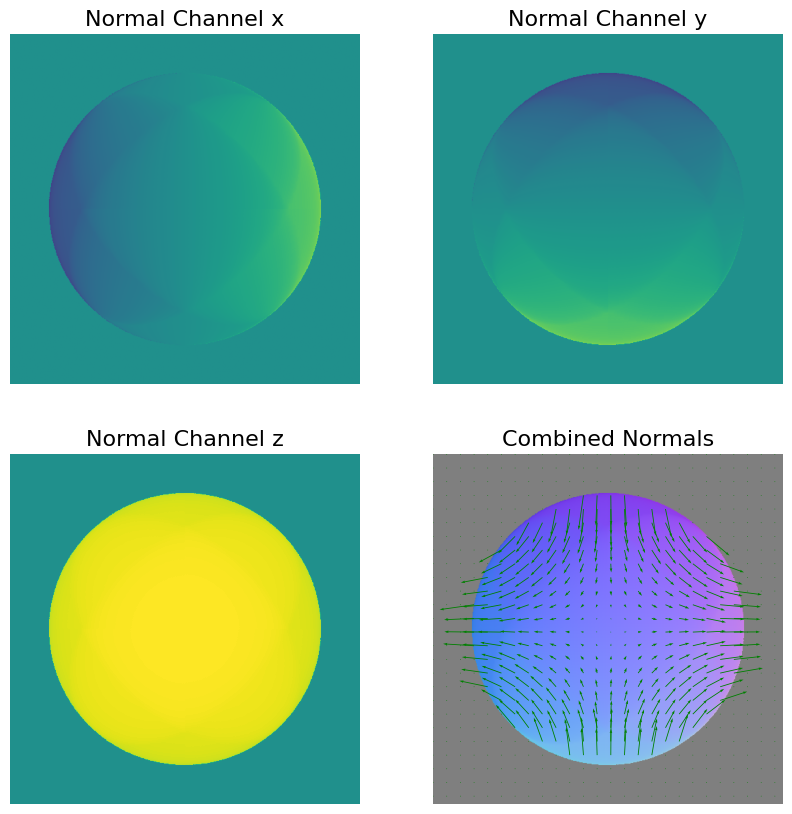

Albedo shape: (512, 512)


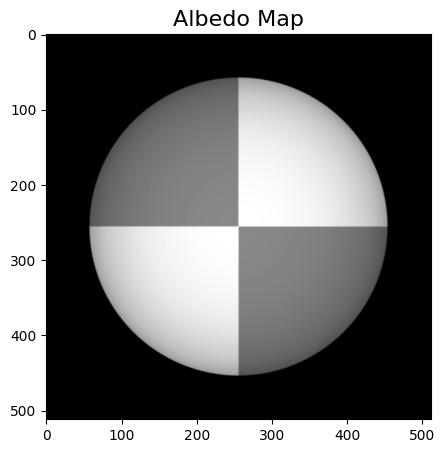

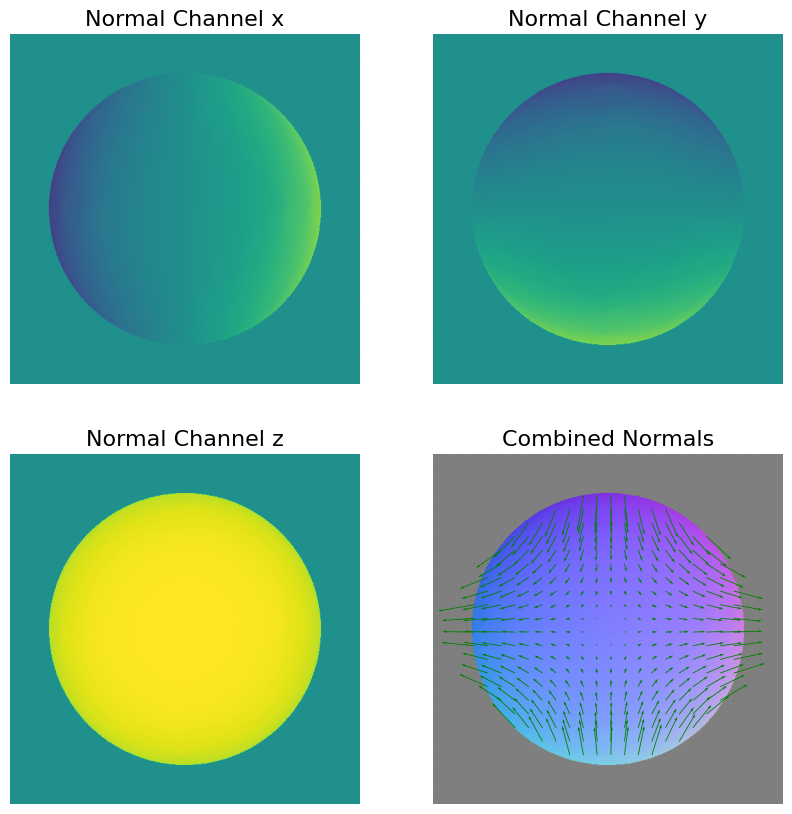

In [159]:
# estimate albedo and normals without shadow trick
albedo_5_no_shadow, normal_5_no_shadow = estimate_albedo_and_normals(image_stack_5, normalized_light_dirs_5, shadow_trick=False)
albedo_25_no_shadow, normal_25_no_shadow = estimate_albedo_and_normals(image_stack_25, normalized_light_dirs_25, shadow_trick=False)

# show results without shadow trick
show_results(albedo_5_no_shadow, normal_5_no_shadow, show_normals=True)
show_results(albedo_25_no_shadow, normal_25_no_shadow, show_normals=True)

##### <font color='yellow'>Answer:</font>

> The key difference, when using the shadow trick with ``SphereGray5``, is that the shadows of the original images are no longer visible. Yet this problem does not seem to occurr on the results from ``SphereGray25`` since there is a greater variety of illumance angles and intensities. Based on this data, the shadow trick proves to be a more efficient method of properly estimating the albedo map.

<a id="question-20"></a>
#### <font color='#FF0000'>Question 20 (5 points)</font>

Before reconstructing the surface height map, it is necessary to compute the partial derivatives, $\frac{\partial f}{\partial x}$ and $\frac{\partial f}{\partial y}$ (referred to as *p* and *q* in the algorithm). These partial derivatives also allow for a double-check of the computation through a test of *integrability*.

In this question, you will need to complete the function `check_integrability()` to compute the partial derivatives *p* and *q*.

Make sure to verify your results by examining the integrability of the computed derivatives.

In [160]:
def check_integrability(normals):
    """
    Checks the surface gradient for integrability.

    This function computes the partial derivatives of the surface function with respect to x and y 
    (p and q), and calculates the squared errors of the mixed partial derivatives to test for integrability.

    Args:
        normals: The normal map of the surface.

    Returns:
        p: The partial derivative of the surface function with respect to x (df/dx).
        q: The partial derivative of the surface function with respect to y (df/dy).
        SE: The squared errors of the mixed partial derivatives.
    """

    # Initialize p, q, and SE
    p = np.zeros(normals.shape[:2])
    q = np.zeros(normals.shape[:2])
    SE = np.zeros(normals.shape[:2])

    # At a point(x, y) on the surface, the normal unit vector is given by N = [a, b, c]
    # The df_dx is then a/c and df_dy is b/c
    epsilon = 1e-6
    p = - normals[..., 0] / (normals[..., 2] + epsilon)
    q = - normals[..., 1] / (normals[..., 2] + epsilon)

    p[np.isnan(p)] = 0
    q[np.isnan(q)] = 0

    # Compute the partial derivatives by shifting the normals array
    # Using the derivative definition: f'(x) = [f(x + h) - f(x)] / h where h is just a pixel
    dp_dx = np.roll(p, shift=-1, axis=1) - p
    dp_dy = np.roll(p, shift=-1, axis=0) - p
    dq_dx = np.roll(q, shift=-1, axis=1) - q
    dq_dy = np.roll(q, shift=-1, axis=0) - q

    # Handle the boundaries by using the 'previous' column/row
    dp_dx[:, -1] = p[:, -1] - p[:, -2]
    dp_dy[-1, :] = p[-1, :] - p[-2, :]
    dq_dx[:, -1] = q[:, -1] - q[:, -2]
    dq_dy[-1, :] = q[-1, :] - q[-2, :]

    # Compute mixed partial derivatives
    df_dxdy = dp_dy
    df_dydx = dq_dx

    # Compute squared errors of the mixed partial derivatives
    SE = (df_dxdy - df_dydx) ** 2

    return p, q, SE

In [161]:
# Use the normals that you found in the previous question
p, q, SE = check_integrability(normals_s5)

print('Showing the integrability check results for 5 light sources:')
print(f'SE max: {SE.max()}\n')

p, q, SE = check_integrability(normals_s25)

print('Showing the integrability check results for 25 light sources:')
print(f'SE max: {SE.max()}')

Showing the integrability check results for 5 light sources:
SE max: 20.99959278226792

Showing the integrability check results for 25 light sources:
SE max: 3.414352949276898


<a id="question-21"></a>
#### <font color='#FF0000'>Question 21 (3 points)</font>

Implement and compute the partial derivatives according to the provided algorithm, and perform the test of integrability by applying a reasonable threshold to the squared errors. 

Reflect on the potential causes of any errors observed. Additionally, analyze how the test of integrability performs when using the GraySphere5 and GraySphere25 datasets. Use the normal maps obtained from the previous steps with the shadow trick applied.

In [162]:
p, q, SE = check_integrability(normal_5_no_shadow)

print('Showing the integrability check results for 5 light sources without shadow trick:')
print(f'SE max: {SE.max()}\n')

p, q, SE = check_integrability(normal_25_no_shadow)

print('Showing the integrability check results for 25 light sources without shadow trick:')
print(f'SE max: {SE.max()}\n')

# Threshold, considering we have an average threshold error for pixel as 0.1
# Then the threshold/pixel for SE would be 0.1^2 = 0.01
# If we consider the whole image then threshold = 0.01 * number of pixels
threshold_5_no_shadow = 0.01 * normals_s5.shape[0] * normals_s5.shape[1]
threshold_25_no_shadow = 0.01 * normals_s25.shape[0] * normals_s25.shape[1]

if SE.max() < threshold_5_no_shadow:
    print('The integrability check passed for 5 light sources without shadow trick.')
else:
    print('The integrability check did not pass for 5 light')

if SE.max() < threshold_25_no_shadow:
    print('The integrability check passed for 25 light sources without shadow trick.')
else:
    print('The integrability check did not pass for 25 light')

Showing the integrability check results for 5 light sources without shadow trick:
SE max: 1.3877411487199824

Showing the integrability check results for 25 light sources without shadow trick:
SE max: 1.2129568611217145

The integrability check passed for 5 light sources without shadow trick.
The integrability check passed for 25 light sources without shadow trick.


##### <font color='yellow'>Answer:</font>

> Observing both the images and their ``SE`` results we can conclude two main things: 
> - Using 25 images instead of 5 images gives us a better result, as the ``SE`` is lower in the 25 images case. This is expected, because for a larger number of images and, therefore, a larger number of light directions, we will have more information about the normals, hence the computation of the normals will be more robust to outliers, creating a more smooth normal map. This is reflected in the ``SE``, because a smoother normal map will have a lower ``SE`` due to the fact that the normals will be more similar to their neighbours. We can also think that more light sources will cover the object from more angles, which will help in the computation of the normals.
> - We also observe that the shadow trick increases the ``SE`` error in both cases. The shadow trick tries to remove the shadows from the image, and by doing so it can create more sharp edges in the image, for example in the edges of the sphere. This will create a higher SE, since the normals will be more different from their neighbours.
>
> One error that is common to both:
> - The edges of the object, in this case, the sphere, give us a higher ``SE``, because, due to the abrupt change in the normals, the partial derivatives will not be continuous, which will give a higher ``SE``. Imagine the following: you are following a straight line and suddenly you found the boundary of the sphere. In the x dimension, the partial derivative will be very high, since the normals will change abruptly, but in the y dimension, the partial derivative will be very low, since the normals will be very similar. This will give a high ``SE``, since the partial derivatives will be very different.

<a id="question-22"></a>
#### <font color='#FF0000'>Question 22 (6 points)</font>

To reconstruct the surface height map, you need to integrate the partial derivatives over a path. Since we are working with discrete structures, this integration is done by summing their values.

The algorithm presented in the chapter suggests performing the integration in a column-major order: start at the top-left corner, integrate along the first column, and then proceed to the right along each row. However, it is also recommended to use multiple paths and average the results to help distribute the errors from derivative estimates.

In this question, you will:

1. Construct the surface height map using column-major order as described in the algorithm.
2. Implement the row-major path integration method.

Your implementation should be added to the `construct_surface()` function.

**Note**: By default, Numpy uses row-major operations. If you unroll an image to linearize the operation, you will end up with a row-major representation. Numpy can be configured to use column-major order, but this concern does not apply if you are using double for-loops without unrolling.

**Hint**: To further inspect the shape of the objects and normal directions, consider using the `matplotlib.pyplot.quiver` function. Be sure to choose appropriate sub-sampling ratios for proper illustration. Add this to the `show_results()` function if needed.

In [163]:
def construct_surface(p, q, path_type='column'):
    """
    Constructs the surface function represented as height_map.

    This function integrates the partial derivatives p and q to reconstruct the surface height map.
    The integration can be done along a column-major, row-major, or an averaged path.

    Args:
        p: The partial derivative of the surface function with respect to x (df/dx).
        q: The partial derivative of the surface function with respect to y (df/dy).
        path_type: The type of path to construct the height_map, either 'column', 'row', or 'average'.

    Returns:
        height_map: The reconstructed surface height map.
    """

    h, w = p.shape
    height_map = np.zeros([h, w])

    if path_type == 'column':
        # Integrate along the first column vertically (q derivative)
        for y in range(1, h):
            height_map[y, 0] = height_map[y - 1, 0] + q[y - 1, 0]

        # Now integrate along the rows horizontally (p derivative) 
        # This will give an L shaped path
        for y in range(0, h):
            for x in range(1, w):
                height_map[y, x] = height_map[y, x - 1] + p[y, x - 1]

    elif path_type == 'row':
        # Integrate along the first row horizontally (p derivative)
        for x in range(1, w):
            height_map[0, x] = height_map[0, x - 1] + p[0, x - 1]
        
        # Now integrate along the columns vertically (q derivative)
        # This will give an -- shaped path
        #                    | 
        for x in range(0, w):
            for y in range(1, h):
                height_map[y, x] = height_map[y - 1, x] + q[y - 1, x]
        

    elif path_type == 'average':
        column_method = construct_surface(p, q, 'column')
        row_method = construct_surface(p, q, 'row')
        height_map = (column_method + row_method) / 2.

    return height_map

Showing the surface reconstruction results for 5 light sources using column-major integration:


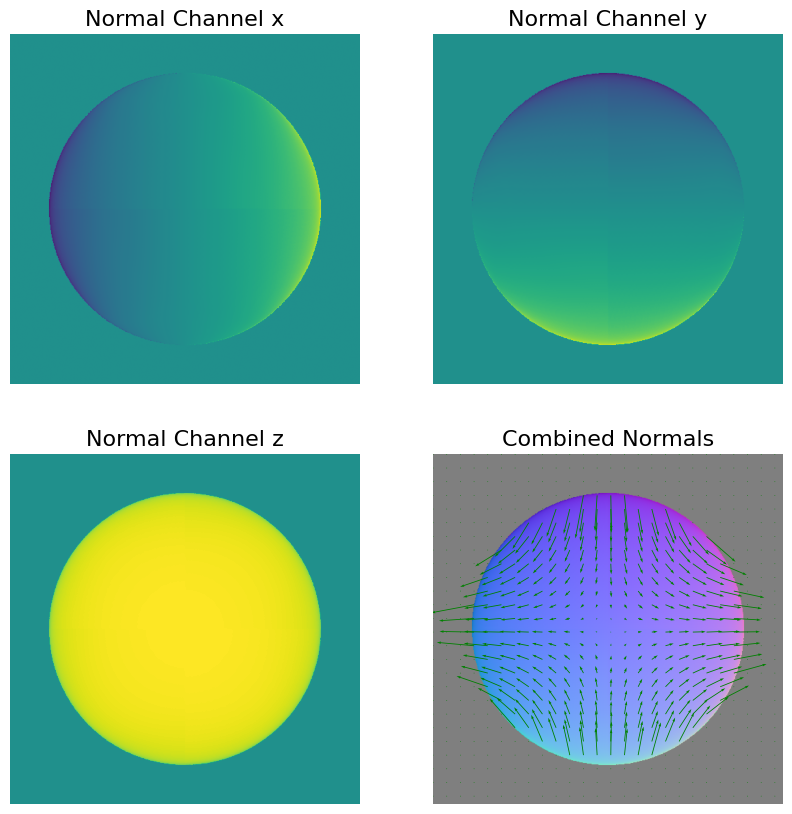

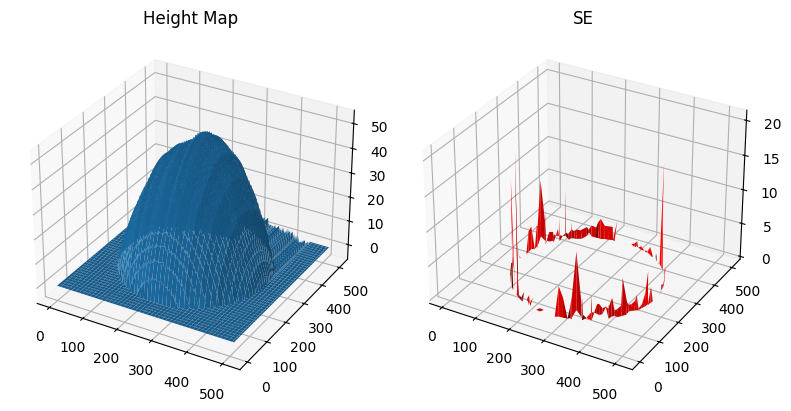

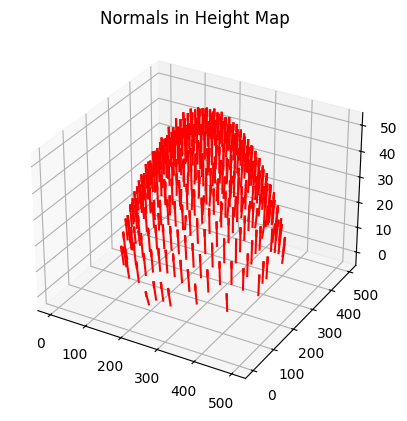

In [164]:
p, q, SE = check_integrability(normals_s5)

height_map = construct_surface(p, q, "column")

# set the threshold for visualization
threshold = 0.01
SE[SE <= threshold] = float('nan')

print('Showing the surface reconstruction results for 5 light sources using column-major integration:')
show_results(None, normals_s5, height_map, SE, show_normals=True, show_normals_3D=True)

<a id="question-23"></a>
#### <font color='#FF0000'>Question 23 (2 points)</font>

Compare the results obtained from the two different integration paths (column-major and row-major). 

What are the differences in the reconstructed surface height maps when using these two paths? Discuss any observations you notice between the two approaches.

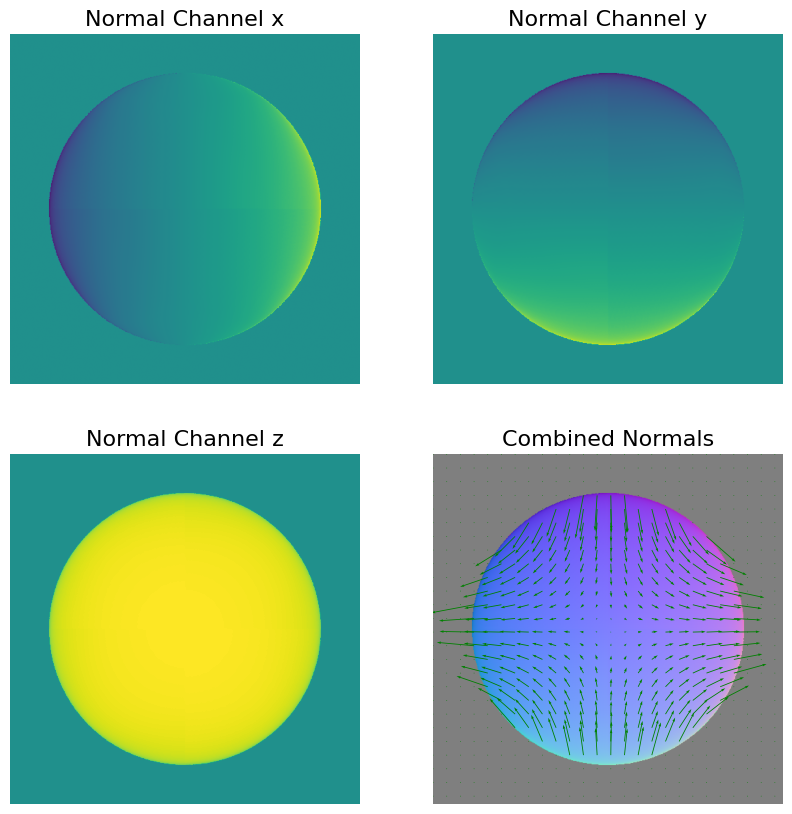

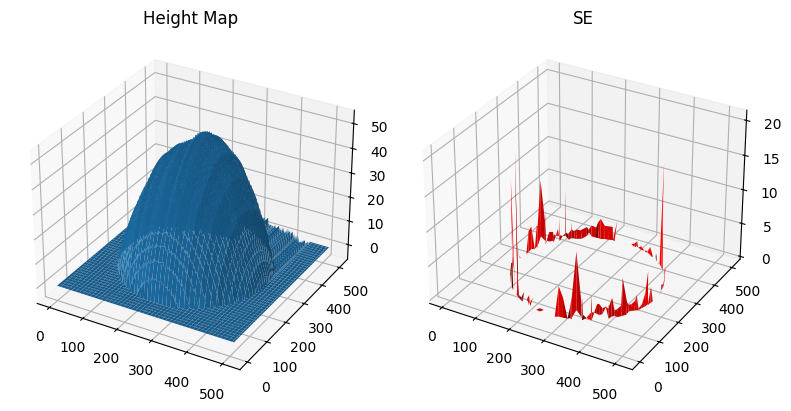

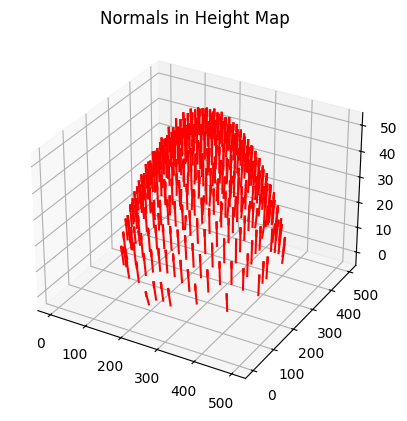

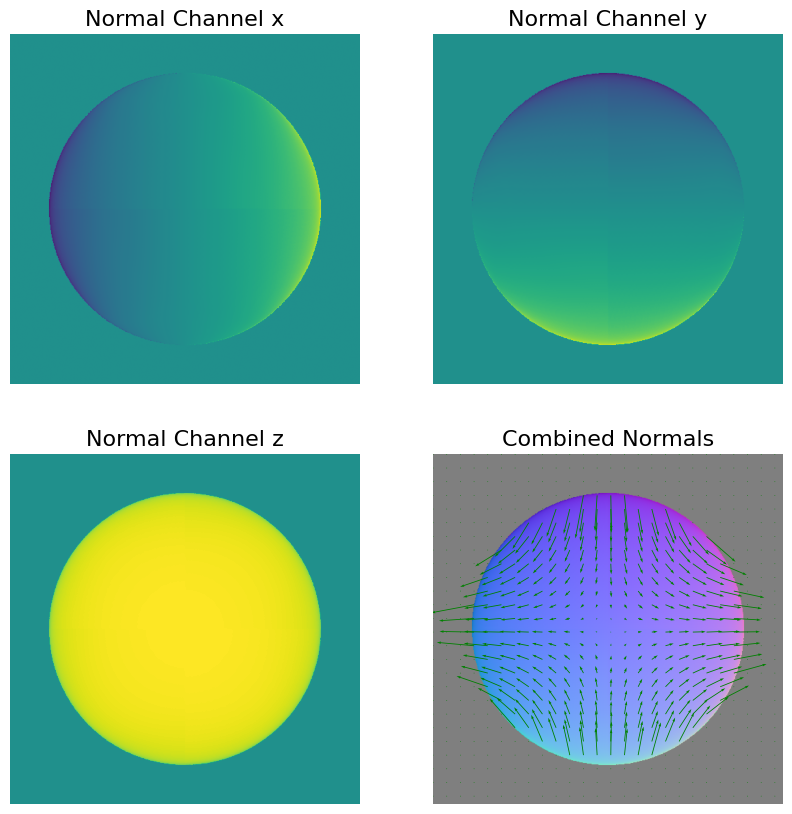

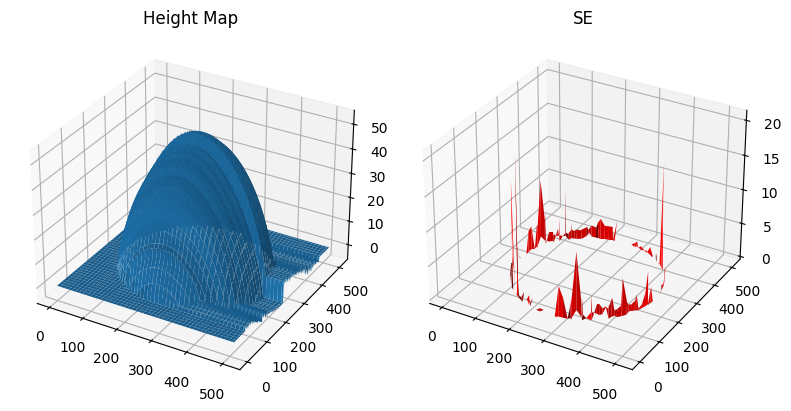

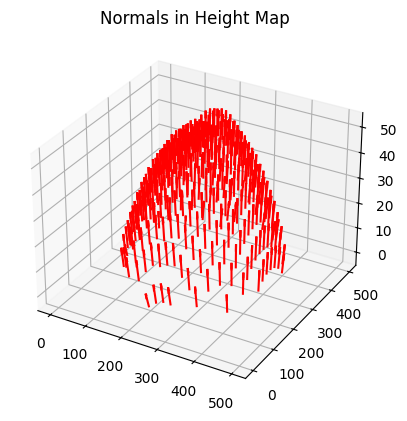

In [165]:
# Build surface using column-major and row-major integration
height_map_column = construct_surface(p, q, 'column')
height_map_row = construct_surface(p, q, 'row')

# Plot the results
show_results(None, normals_s5, height_map_column, SE, show_normals=True, show_normals_3D=True)
show_results(None, normals_s5, height_map_row, SE, show_normals=True, show_normals_3D=True)

##### <font color='yellow'>Answer:</font>

> By observing both height maps we can see that:
> - The first image shows an abrupt change vertically around the middle of the image. 
> - The second image shows an abrupt change horizontally around the middle of the image.
>
> To explain this we first need to keep in mind that our sphere is centered in the image, does not touch the boundaries of the image (which would change the first part of the paths on the integration) and that the spheres are divided into four quadrants, with the top-left and bottom-right quadrants being darker and the top-right and bottom-left quadrants being lighter.
>
> On the first image we first integrate along the left-most column, which does not present any errors, and then we follow a straight line to the right, following each pixel of the row. In this path, we will encounter the vertical change of the quadrants of the sphere, from light to dark or vice-versa. This will create a very abrupt change in the normals, which will create a discontinuity in the partial derivative $\frac{\partial{f}}{\partial{y}}$, meaning that we are going to observe a 'jump' in the height map. This is what we observe in the first image.
>
> On the second image we first integrate along the top-most row, which does not present any errors, and then we follow a straight line to the bottom, following each pixel of the column. In this path, we will encounter the horizontal change of the quadrants of the sphere, from light to dark or vice-versa. This will create a very abrupt change in the normals, which will create a discontinuity in the partial derivative $\frac{\partial{f}}{\partial{x}}$, meaning that we are going to observe a 'jump' in the height map. This is what we observe in the second image.

<a id="question-24"></a>
#### <font color='#FF0000'>Question 24 (3 points)</font>

Now, take the average of the results obtained from the column-major and row-major integration paths.

Do you observe any improvement compared to using only one path? Additionally, analyze whether the construction results vary when using different numbers of images in the reconstruction process. (So compare the results obtained from the GraySphere5 and GraySphere25 datasets.)

Showing the surface reconstruction results for 5 light sources using average of column-major and row-major integration:


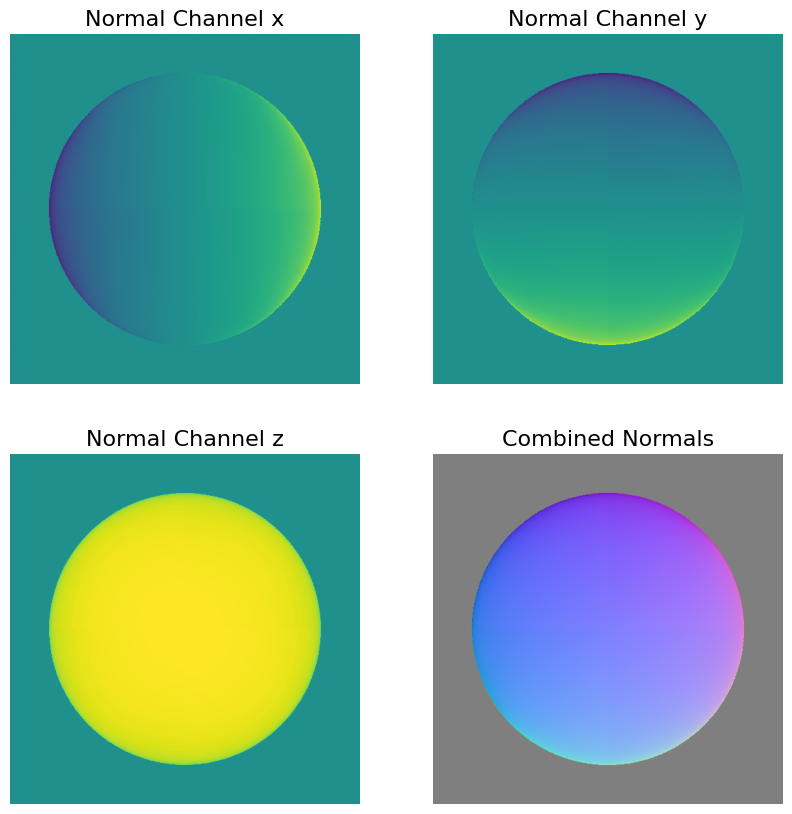

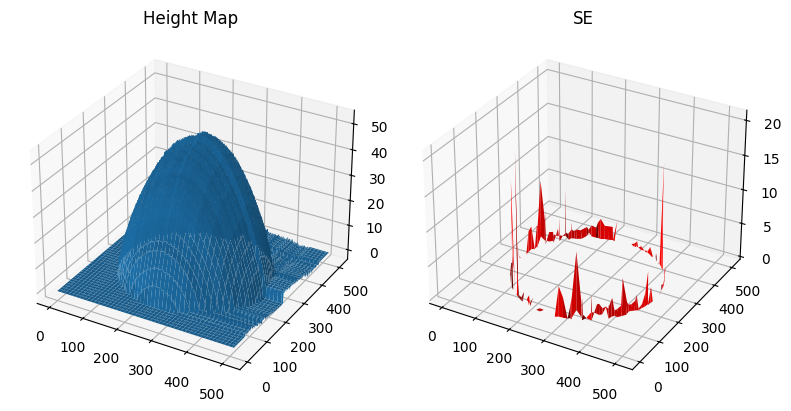

Showing the surface reconstruction results for 25 light sources using average of column-major and row-major integration:


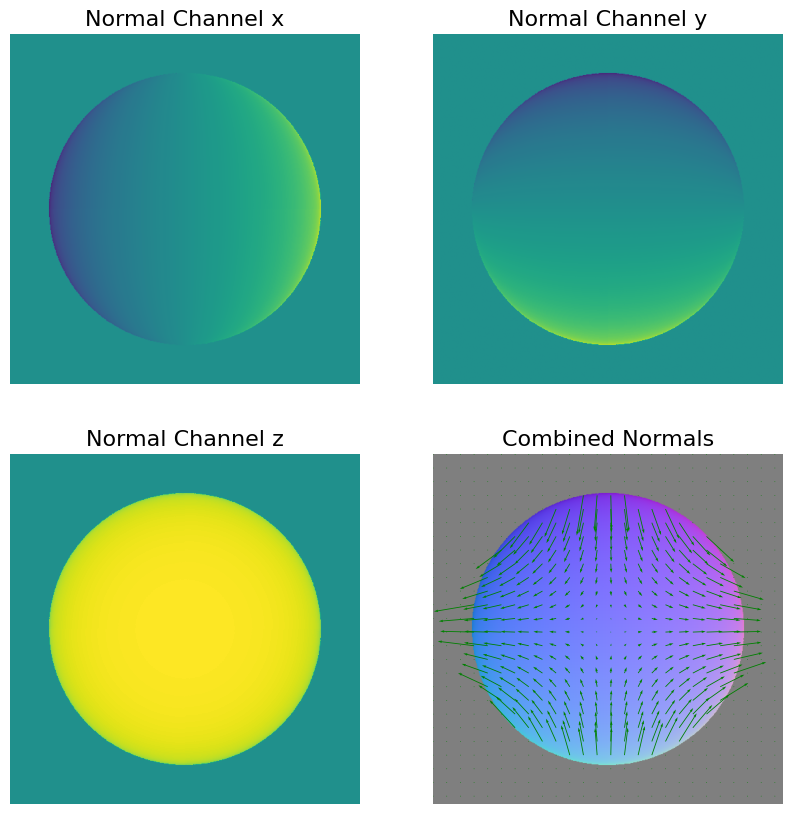

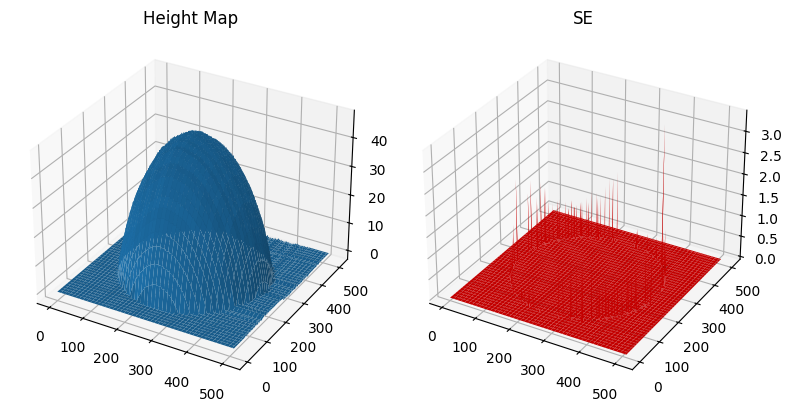

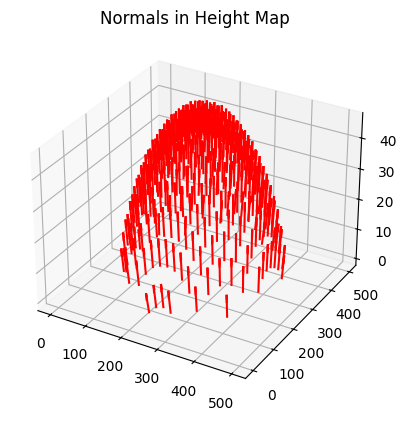

In [166]:
# Build surface using average integration
height_map_avg = construct_surface(p, q, 'average')

# Plot the results
print('Showing the surface reconstruction results for 5 light sources using average of column-major and row-major integration:')
show_results(None, normals_s5, height_map_avg, SE)

# Now for 25 light sources
p_s25, q_s25, SE_s25 = check_integrability(normals_s25)

height_map_avg_s25 = construct_surface(p_s25, q_s25, 'average')

# Plot the results
print('Showing the surface reconstruction results for 25 light sources using average of column-major and row-major integration:')
show_results(None, normals_s25, height_map_avg_s25, SE_s25, show_normals=True, show_normals_3D=True)


##### <font color='yellow'>Answer:</font>

> We now observe that the height map is smoother than before, meaning the abrupt changes are now averaged, which gives us a more continuous height map. This is relevant, meaning that if we have an object that has a preference in the direction of some colour or ilumination, the best way to integrate the partial derivatives is to use multiple paths, which gives a more robust result.
>
> Comparing the results from the ```GraySphere5``` and ```GraySphere25```, we observe that the ```GraySphere25``` is smoother, which makes sense since the derivatives are smoother, due to the larger number of images. However, the change is not very significant, since the ```GraySphere5``` already gives us a good result. Meaning the average of the paths can compensate for the lack of images that make the derivatives smoother.

<a id="question-25"></a>
#### <font color='#FF0000'>Question 25 (3 points)</font>

Run the photometric stereo algorithm on the MonkeyGray model using the `photometric_stereo` function and display the results. Complete the provided code, execute the algorithm, and show the outcomes.

In [167]:
def photometric_stereo(image_dir='./photometrics_images/MonkeyGray/', show_normals=False, show_normals_3D=False):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for a given set of images under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './images/photometrics_images/MonkeyGray/').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_synthetic_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface gradient from the stack of images and light source matrix
    print('Computing surface albedo and normal map...\n')
    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')
    p, q, SE = check_integrability(normals)

    # set the threshold for visualization
    threshold = 0.01
    SE[SE <= threshold] = float('nan')

    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height
    print('Computing surface height map...\n')

    height_map = construct_surface(p, q, "column")

    # show results
    print('Displaying results...\n')
    show_results(albedo, normals, height_map, SE, show_normals=show_normals, show_normals_3D=show_normals_3D)

If you estimate the albedo and surface normal for MonkeyGrat, the cell below will run for at least 20 seconds.

Loading images...

image size (h*w): 512*512
Finish loading 121 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 3391

Computing surface height map...

Displaying results...

Albedo shape: (512, 512)


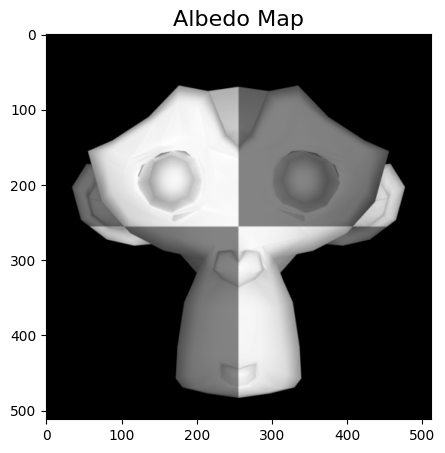

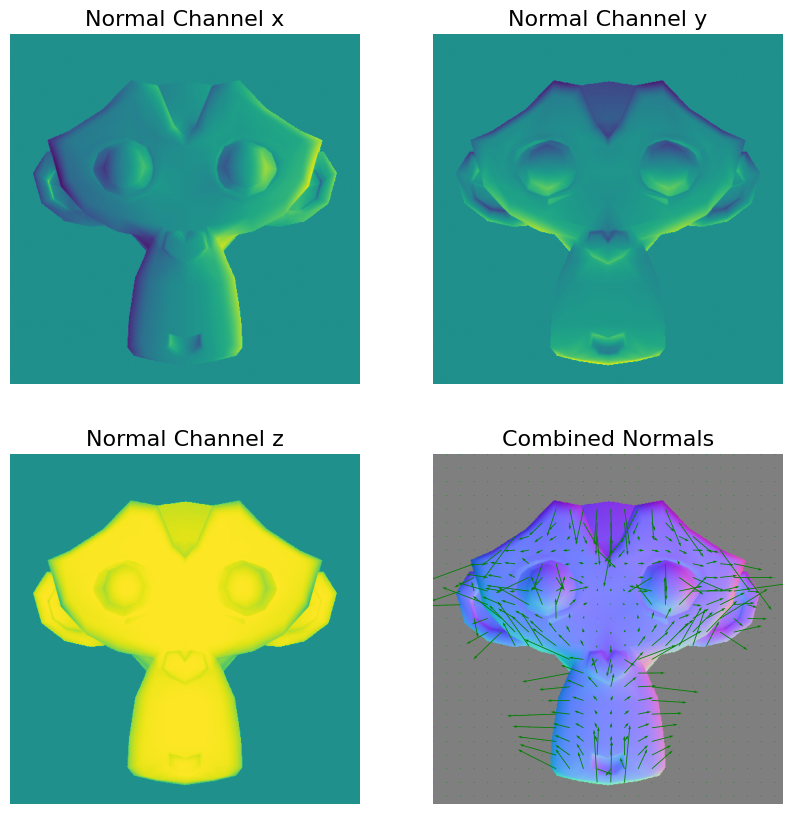

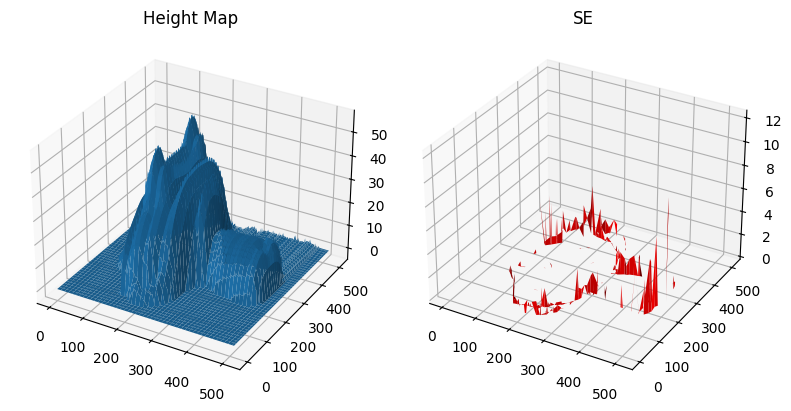

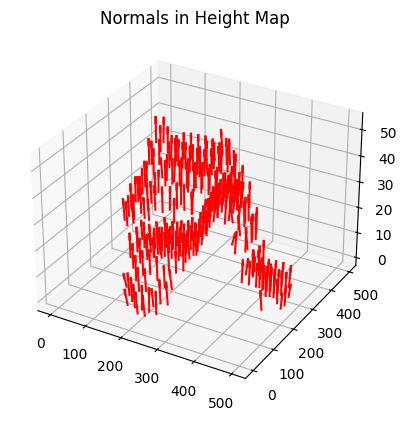

In [168]:
# Use the function
image_dir = './photometrics_images/MonkeyGray/'
photometric_stereo(image_dir, show_normals=True, show_normals_3D=True)

<a id="question-26"></a>
#### <font color='#FF0000'>Question 26 (2 points)</font>

The albedo results for the MonkeyGray model may exhibit more errors compared to the sphere. Observe and describe the errors that arise when running the photometric stereo algorithm on the MonkeyGray model.

What could be the reasons for these errors? Experiment with different numbers of images, as you did in Question 15 and Question 18, to see the effects and discuss your observations.

##### <font color='yellow'>Answer:</font>

> Besides the errors associated with the boundaries of the object, which were explained before, the Monkey has a more complex 3D geometry, meaning we have more shadows in the object that are created from their inner parts, we have more sharp edges and more concave parts, which also translates in more inner reflections. All of these characteristics will cause changes in the shading of the object, which will create errors in the normals of the object. This errors will be reflected in the partial derivatives, which will create errors in the height map.

<a id="question-27"></a>
#### <font color='#FF0000'>Question 27 (2 points)</font>

Considering the errors observed in the albedo results for the MonkeyGray model, what do you think could help in reducing or solving these errors? Provide your thoughts on potential strategies or methods that might improve the accuracy of the results.

##### <font color='yellow'>Answer:</font>

> - Instead of having a fixed camera and moving the light sources, we could move the camera. This would give us more information about the object, since we would be measuring the normals across different angles. However, this would mean that we would need some algorithm to patch the images and the results. 
> - Increase the number of images. 
> - Interpolate the derivatives, which would give us a smoother result, and then integrate the partial derivatives. 
>
> ```Resources```: Horn, Berthold. (1986). Robot Vision.

<a id="question-28"></a>
#### <font color='#FF0000'>Question 28 (5 points)</font>

So far, we have assumed that albedos and input images are 1-channel grayscale images. To work with 3-channel RGB images, a simple approach is to split the input image into separate channels and treat them individually. However, this method may introduce issues when constructing the surface normal map if a pixel value in a channel is zero.

Update the implementation to work with 3-channel RGB inputs. Complete the functions `load_synthetic_images_rgb` and `estimate_albedo_and_normals_rgb ` to handle RGB images, and test your updated implementation with the SphereColor and MonkeyColor models using the `photometric_stereo_rgb` function. Make sure to display the results.

In [169]:
def load_synthetic_images_rgb(image_dir):
    """
    Loads synthetic RGB images and light directions.

    This function reads images from the specified directory, processes each color channel separately, 
    and stacks them together along with their corresponding light directions.

    Args:
        image_dir: Path to the directory containing the images.

    Returns:
        A tuple containing the image stack and the light directions.
    """

    # list all files in the image directory
    image_files = os.listdir(image_dir)
    num_images = len(image_files)

    image_stack = None
    light_directions = None
    
    # assumed z component for the light direction
    z_component = 0.5  

    # loop through all image files
    for i in range(num_images):
        # read the input image
        image = cv2.imread(os.path.join(image_dir, image_files[i]))
        image = np.flip(image, axis=-1)  # flip the image to correct the channel order
        
        # initialize image stack and light direction array on the first iteration
        if image_stack is None:
            height, width, _ = image.shape
            print('image size (h*w): %d*%d' % (height, width))
            image_stack = np.zeros([height, width, 3, num_images], dtype=int)
            light_directions = np.zeros([num_images, 3], dtype=np.float64)

        # stack the image along the fourth dimension for RGB
        for j, channel in enumerate([0, 1, 2]):
            image_stack[:, :, j, i] = image[:, :, channel]

        # extract light direction from the image filename
        x_component = np.double(image_files[i][(image_files[i].find('_') + 1):image_files[i].rfind('_')])
        y_component = np.double(image_files[i][image_files[i].rfind('_') + 1:image_files[i].rfind('.png')])
        light_directions[i, :] = [x_component, -y_component, z_component]

    # convert the image stack to double precision for further processing
    image_stack = np.double(image_stack)

    # normalize the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)

    # handle the case where all pixel values are the same
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  

    # normalize the light direction vectors
    norm_factors = np.tile(np.sqrt(np.sum(light_directions ** 2, axis=1, keepdims=True)), (1, light_directions.shape[1]))
    scriptV_rgb = light_directions / norm_factors

    return image_stack, scriptV_rgb

In [170]:
def estimate_albedo_and_normals_rgb(image_stack, scriptV, shadow_trick=True):
    """
    Estimates albedo and normals from a stack of RGB images and light directions.

    This function processes each color channel separately to estimate the albedo and normal maps.
    The results from each channel are then combined to produce the final albedo and normal maps.

    Args:
        image_stack: Image stacks for each color channel.
        scriptV: Light directions for each color channel.
        shadow_trick: Whether or not to use the shadow trick. Defaults to True.

    Returns:
        A tuple containing the albedo and normal maps.
    """
    # Extract dimensions
    h, w, c, n = image_stack.shape  # h: height, w: width, c: channels (3 for RGB), n: number of images

    red_albedo, red_normals = estimate_albedo_and_normals(image_stack[:, :, 0, :], scriptV, shadow_trick)
    green_albedo, green_normals = estimate_albedo_and_normals(image_stack[:, :, 1, :], scriptV, shadow_trick)
    blue_albedo, blue_normals = estimate_albedo_and_normals(image_stack[:, :, 2, :], scriptV, shadow_trick)

    # Combine the albedo and normal maps from each channel
    albedo = np.stack([red_albedo, green_albedo, blue_albedo], axis=2)
    normals = (red_normals + green_normals + blue_normals)
    normals /= np.linalg.norm(normals, axis=2, keepdims=True)

    print('Albedo shape:', albedo.shape)
    print('Normals shape:', normals.shape)

    return albedo, normals

In [171]:
def photometric_stereo_rgb(image_dir='./SphereColor/', show_normals=False, show_normals_3D=False):
    """
    Performs photometric stereo on RGB images to estimate the surface albedo, normals, and height map.

    This function loads RGB images from the specified directory, computes the surface albedo and 
    normal maps, checks integrability, reconstructs the surface height map, and displays the results.

    Args:
        image_dir: Path to the directory containing the images.
    """

    # Load RGB images and light directions
    print('Loading RGB images...\n')
    image_stack_rgb, light_dirs_rgb = load_synthetic_images_rgb(image_dir)
    print(f'Image stack shape: {image_stack_rgb.shape}')
    print(f'Light directions shape: {light_dirs_rgb.shape}')
    [h, w, c, n] = image_stack_rgb.shape
    print(f'Finished loading {n} images.\n')

    # Estimate albedo and normal maps
    print('Computing surface albedo and normal map...\n')
    albedo_rgb, normals_rgb = estimate_albedo_and_normals_rgb(image_stack_rgb, light_dirs_rgb)
    print(f'Albedo shape: {albedo_rgb.shape}')
    print(f'Normals shape: {normals_rgb.shape}\n')

    # Check integrability of the surface normal map
    print('Integrability checking...\n')
    p, q, SE = check_integrability(normals_rgb)

    # Set the threshold for visualization
    threshold = 0.01
    SE[SE <= threshold] = float('nan')

    print(f'Number of outliers: {np.sum(SE > threshold)}\n')
    SE[SE <= threshold] = float('nan')  # For better visualization

    # Compute the surface height map using column-major integration
    print('Computing surface height map...\n')
    height_map_column = construct_surface(p, q, path_type='column')

    # Display results
    print('Displaying results...\n')
    show_results(albedo_rgb, normals_rgb, height_map=height_map_column, SE=SE, show_normals=show_normals, show_normals_3D=show_normals_3D)

If you estimate the albedo and surface normal for SphereColor and MonkeyColor, the cell below will run for atleast 1 or 2 minutes.

Loading RGB images...

image size (h*w): 512*512
Image stack shape: (512, 512, 3, 121)
Light directions shape: (121, 3)
Finished loading 121 images.

Computing surface albedo and normal map...



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.3706152735561636].


Albedo shape: (512, 512, 3)
Normals shape: (512, 512, 3)
Albedo shape: (512, 512, 3)
Normals shape: (512, 512, 3)

Integrability checking...

Number of outliers: 3535

Computing surface height map...

Displaying results...

Albedo shape: (512, 512, 3)


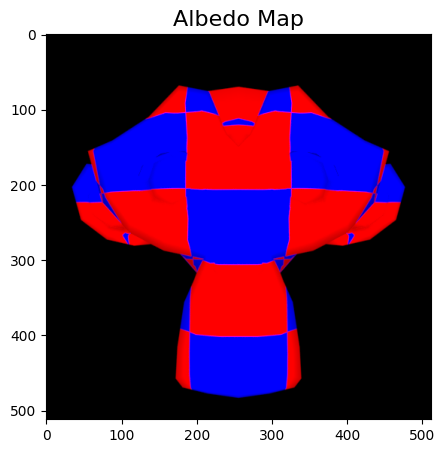

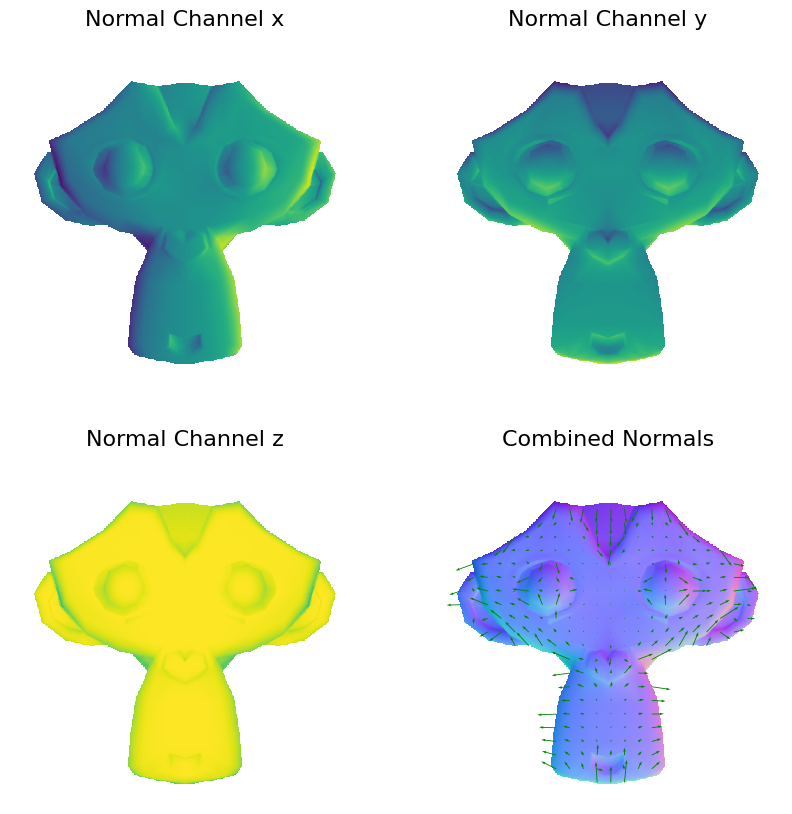

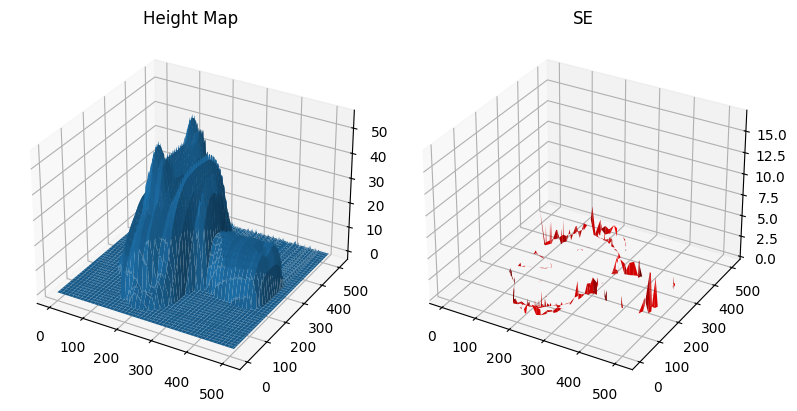

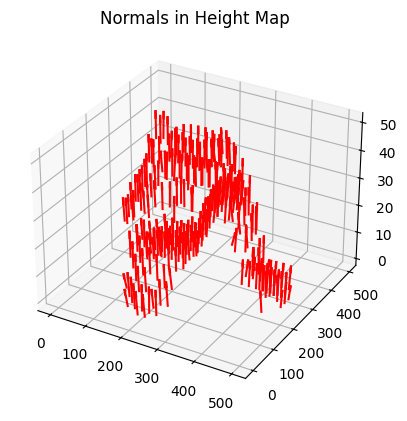

Loading RGB images...

image size (h*w): 512*512
Image stack shape: (512, 512, 3, 25)
Light directions shape: (25, 3)
Finished loading 25 images.

Computing surface albedo and normal map...



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.3330540801140764].


Albedo shape: (512, 512, 3)
Normals shape: (512, 512, 3)
Albedo shape: (512, 512, 3)
Normals shape: (512, 512, 3)

Integrability checking...

Number of outliers: 1491

Computing surface height map...

Displaying results...

Albedo shape: (512, 512, 3)


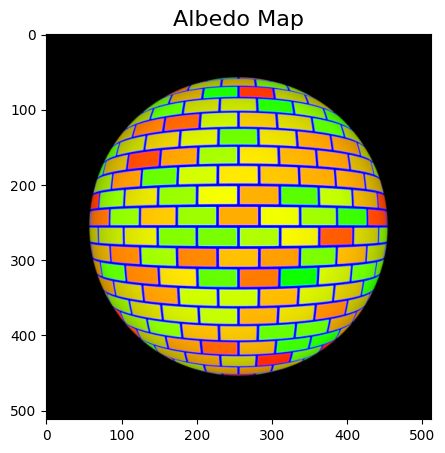

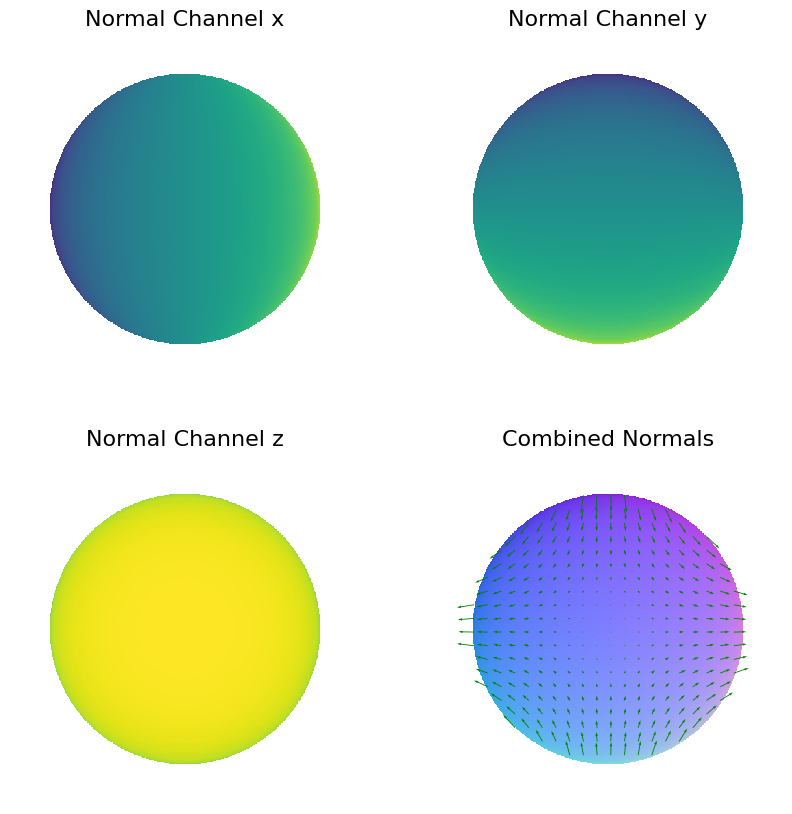

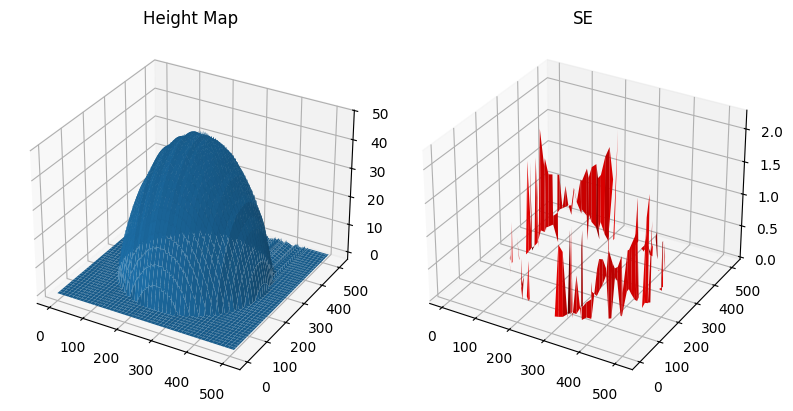

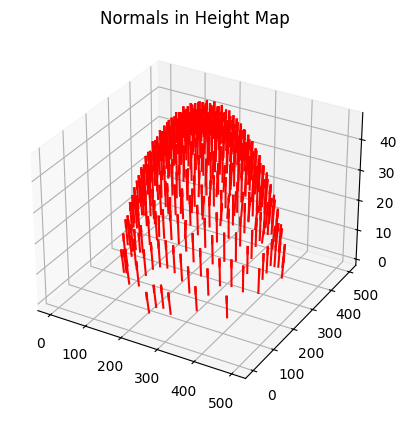

In [183]:
# Use the function
image_dir = './photometrics_images/MonkeyColor/'
photometric_stereo_rgb(image_dir, show_normals=True, show_normals_3D=True)

image_dir_sphere = './photometrics_images/SphereColor/'
photometric_stereo_rgb(image_dir_sphere, show_normals=True, show_normals_3D=True)

<a id="question-29"></a>
#### <font color='#FF0000'>Question 29 (2 points)</font>

Explain the changes made to the function and discuss the results of these changes.

##### <font color='yellow'>Answer:</font>

> Basically to compute the Photometric Stereo in a RGB image we need to compute the albedo and the normals for each channel of the image individually. Then we stack the albedo along the channels and will have that the last dimension of this stack is the number of channels, so then we can show the albedo as a normal RGB image.
> 
> Relative to the normals, we will have one normal per pixel per channel, for representation purposes we can show the sum of this normals, giving the direction of the normal in the RGB space, and then we can normalize this vector. 

<a id="question-30"></a>
#### <font color='#FF0000'>Question 30 (2 points)</font>

Observe the problem in the constructed surface normal map and height map. Explain why a zero pixel could be a problem and propose a way to overcome that.

##### <font color='yellow'>Answer:</font>

> In the photometric stereo technique, the surface normal and, therefore, the height map are constructed from the intensity values registered across different images, each one under different lightning conditions. If we encounter a black pixel (one that has value 0) basically what we are saying is that all light is absorved, hence the reflectance in that point is zero. If the reflectance is zero, then the normal would be zero. However, the neighbour pixels, if not black, will have a normal, which will create a discontinuity in the normal map, creating a discontinuity in the partial derivatives, which are then used to compute the height map. This will create a 'jump' in the height map, which is not correct. This might create a 'glitch' in the height map. To overcome this one could interpolate the value of the pixel, using the values of the neighbours, by using the mean, median, a linear interpolation or other kind of filter.

<a id="question-31"></a>
#### <font color='#FF0000'>Question 31 (4 points)</font>

Now, it's time to apply the algorithm to real-world datasets. We will first use the Yale Face Database.

For the Face dataset, you should:
- Load the images
- Compute the surface albedo and normal map
- Run the integrability check
- Find the number of outliers
- Compute the surface height
- Show the results

Run the algorithm for the Yale Face images: [Yale Face Database](http://cvc.cs.yale.edu/cvc/projects/yalefaces/yalefaces.html). The Yale face data is included in the lab material. The `load_face_images` function is provided as a helper. You should complete the `photometric_stereo_face_dataset` function as part of this task.

Make sure to display the results for the Face dataset using the 3 paths (column-major, row-major, and average) when constructing the surface height map.

**Hint**: For proper computation of albedo and surface normal, you may want to suspend the shadow trick described in the text, and use the original formula:
$$i = Vg(x,y)$$

In [173]:
def load_face_images(image_dir='./photometrics_images/yaleB02/'):
    """
    Loads a set of face images from the Yale Face Database and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Yale Face images. Defaults to './photometrics_images/yaleB02/'.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with the ambient image subtracted and normalized.
            - scriptV: An array of light direction vectors corresponding to each image.
    """
    
    # define the number of images to load
    num_images = 64
    
    # load the ambient image (the image without any lighting)
    filename = os.path.join(image_dir, 'yaleB02_P00_Ambient.pgm')
    ambient_image = cv2.imread(filename, -1)
    
    # get the height and width of the ambient image
    h, w = ambient_image.shape

    # import glob to find all image files in the directory
    import glob
    
    # get a list of all image files that match the pattern for the yaleB02 face dataset
    d = glob.glob(os.path.join(image_dir, 'yaleB02_P00A*.pgm'))
    
    # randomly select a subset of images to match the num_images count
    import random
    d = random.sample(d, num_images)
    
    # extract the base filenames from the list of image paths
    filenames = [os.path.basename(x) for x in d]

    # initialize arrays for storing angles and image data
    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    # loop through each selected image file
    for j in range(num_images):
        # extract the lighting angles from the filename
        ang[0,j], ang[1,j] = np.double(filenames[j][12:16]), np.double(filenames[j][17:20])
        
        # load the image and subtract the ambient image to get the actual illumination effect
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1) - ambient_image

    # calculate the light direction vectors based on the extracted angles
    x = np.cos(np.pi*ang[1,:]/180) * np.cos(np.pi*ang[0,:]/180)
    y = np.cos(np.pi*ang[1,:]/180) * np.sin(np.pi*ang[0,:]/180)
    z = np.sin(np.pi*ang[1,:]/180)
    
    # combine the direction vectors, adjusting for normal direction
    scriptV = [-1,-1,1] * np.array([y,z,x]).transpose(1,0)  ##eggonz COMMENT: fix (-1,-1,1) normal directiona

    # convert the image stack to double precision
    image_stack = np.double(image_stack)
    
    # set any negative pixel values to 0 (removing underflow)
    image_stack[image_stack<0] = 0
    
    # find the minimum and maximum pixel values in the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    
    # normalize the image stack to have values between 0 and 1, or set to zeros if min and max are equal
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  # avoid failure when all pixel values are the same

    # return the processed image stack and light directions
    return image_stack, scriptV

In [174]:
image_stack, scriptV = load_face_images()
for vector in scriptV[:,]:
    print(vector)

[-0.81379768 -0.34202014  0.46984631]
[ 0.71984631 -0.64278761 -0.26200263]
[-0.55403229 -0.25881905  0.79124012]
[-0.000000e+00 -1.000000e+00  6.123234e-17]
[-0.93611681 -0.34202014  0.08189961]
[-0.24321035 -0.34202014  0.90767337]
[0.53898554 0.34202014 0.76975113]
[ 0.43938504 -0.64278761  0.62750687]
[ 0.93969262 -0.          0.34202014]
[ 0.66446302 -0.70710678  0.24184476]
[0.58682409 0.64278761 0.49240388]
[ 0.08583165 -0.17364818  0.98106026]
[ 0.24240388 -0.90630779  0.34618861]
[-0.58682409  0.64278761  0.49240388]
[-0.         -0.34202014  0.93969262]
[ 0.9961947  -0.         -0.08715574]
[-0.16317591  0.34202014  0.92541658]
[-0.24240388 -0.90630779  0.34618861]
[0.81379768 0.34202014 0.46984631]
[-0.08583165  0.17364818  0.98106026]
[-0.08583165 -0.17364818  0.98106026]
[-0.71984631 -0.64278761 -0.26200263]
[-0.          0.34202014  0.93969262]
[-0.39713126 -0.90630779 -0.14454396]
[ 0.55403229 -0.25881905  0.79124012]
[0.93611681 0.34202014 0.08189961]
[ 0.17364818 -0.  

In [175]:
def photometric_stereo_face_dataset(image_dir='./photometrics_images/yaleB02/', path_type='average'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Yale Face Dataset under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './images/photometrics_images/yaleB02/').
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_face_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')

    # YOUR CODE HERE
    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=False)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    # YOUR CODE HERE
    p, q, SE = check_integrability(normals)


    # YOUR CODE HERE
    threshold = 0.01


    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height map
    print('Computing surface height map...\n')

    # YOUR CODE HERE
    height_map = construct_surface(p, q, path_type)
    

    # show results
    print('Displaying results...\n')

    # YOUR CODE HERE
    show_results(albedo, normals, height_map=height_map, SE=SE, show_normals=False)

If you estimate the albedo and surface normal using the three path types, the cell below will run for at least 10 seconds.

average height map
Loading images...

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 1876

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


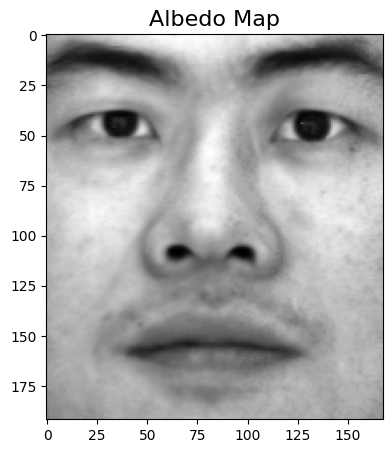

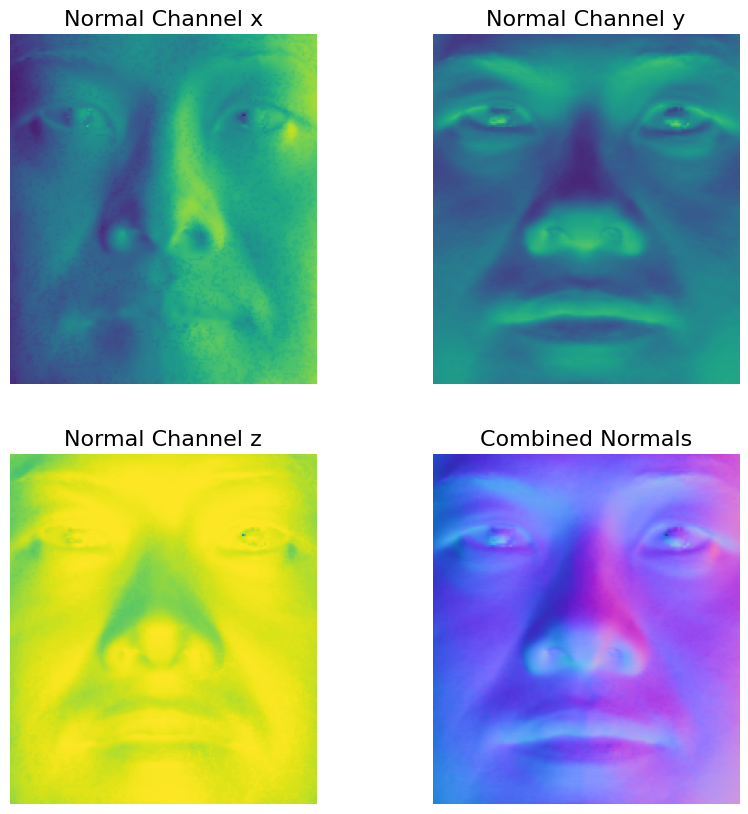

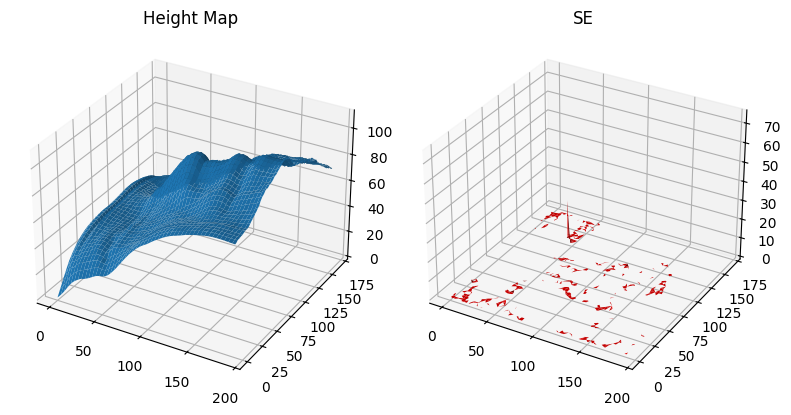

column-major height map
Loading images...

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 1876

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


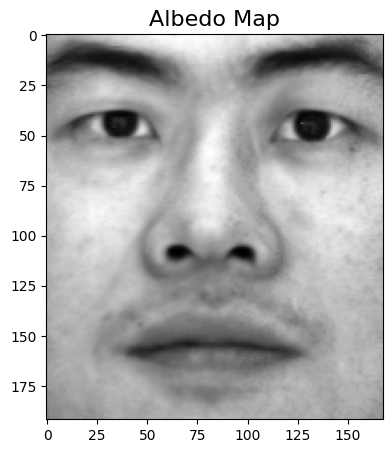

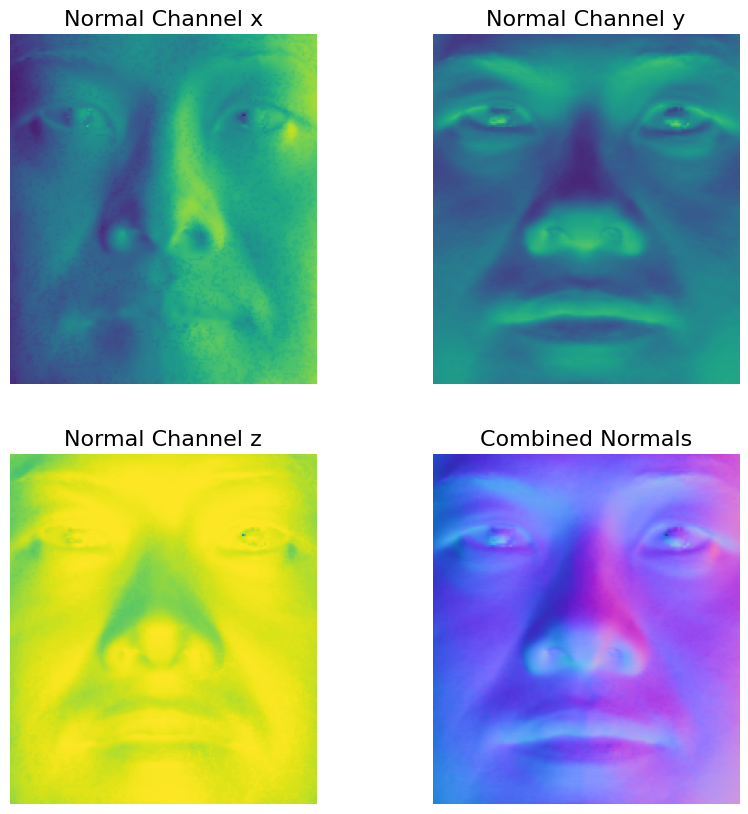

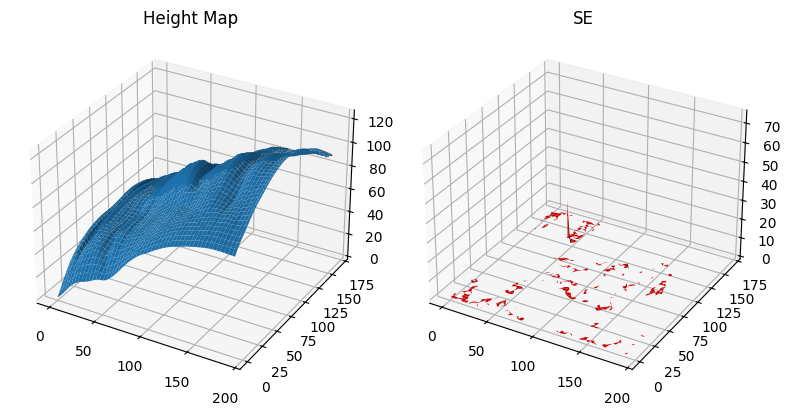

row-major height map
Loading images...

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 1876

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


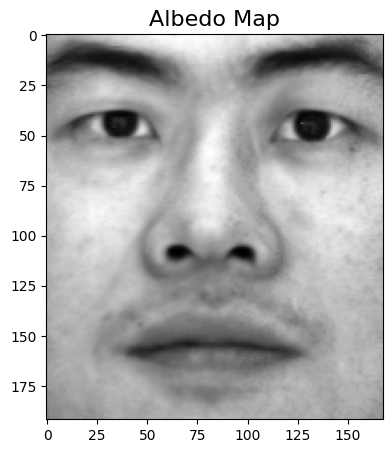

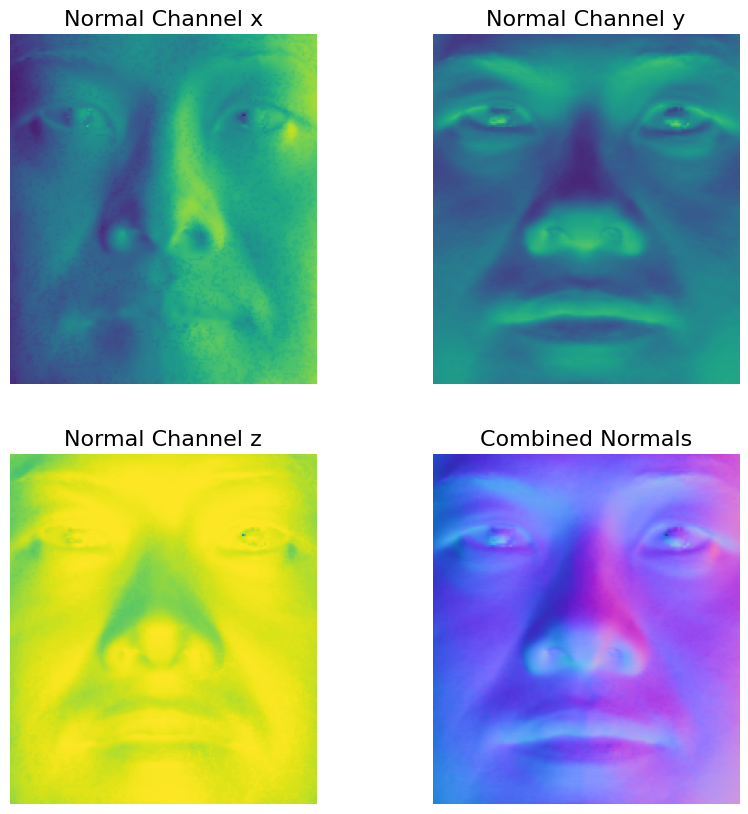

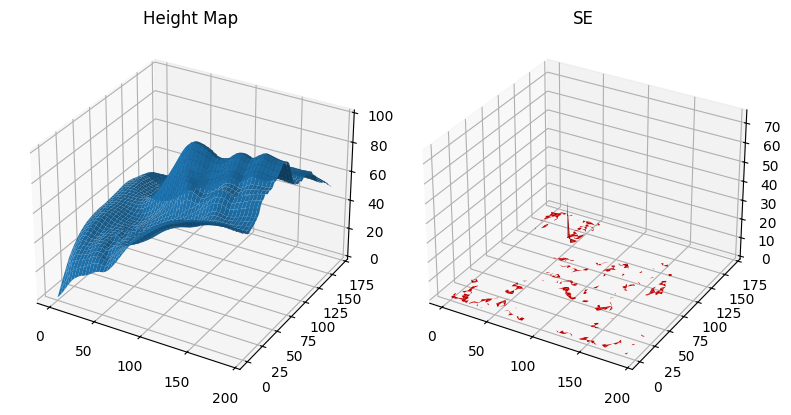

In [176]:
# YOUR CODE HERE

# Make sure to display the results for the Face dataset using the 3 paths (column-major, row-major, and average) when constructing the surface height map.
print('average height map')
photometric_stereo_face_dataset(path_type='average')

print('column-major height map')
photometric_stereo_face_dataset(path_type='column')

print('row-major height map')
photometric_stereo_face_dataset(path_type='row')


<a id="question-32"></a>
#### <font color='#FF0000'>Question 32 (1 point)</font>

Observe and discuss the results for different integration paths in the `photometric_stereo_face_dataset` function.

##### <font color='yellow'>Answer:</font>

>We can observe that the column method shows a more flat surface than the row method, which shows a more curved surface and with more height. This happens due to the complex geometry of the face. When considering horizontal and vertical lines across the face, horizontal lines encounter more abrupt changes, such as the nose, while vertical lines typically follow smoother transitions, like the cheeks. As a result, the partial derivatives along $x$ (horizontal direction) are less smooth, capturing significant variations in the surface height. The derivatives along $y$ (vertical direction) are smoother, which gives us a smoother and more continuous/flat height map.
>The average method gives us a smoother height map, with a more realistic representation of the face, since it compensates for the errors in the partial derivatives by averaging them.

<a id="question-33"></a>
#### <font color='#FF0000'>Question 33 (2 points)</font>

Discuss how the images violate the assumptions of the shape-from-shading methods. Include specific input images to illustrate your points.

##### <font color='yellow'>Answer:</font>

>*Write your answer here.*

<a id="question-34"></a>
#### <font color='#FF0000'>Question 34 (2 points)</font>

How would the results improve when the problematic images are removed? Try it out and show the results in your notebook.

To complete this task, you should implement the `load_face_images_filtered` and `photometric_stereo_face_filtered` functions.

In [177]:
def load_face_images_filtered(image_dir='./photometrics_images/yaleB02/', bad_images=[]):
    """
    Loads a set of face images from the Yale Face Database, excluding problematic ones, and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Yale Face images. Defaults to './photometrics_images/yaleB02/'.
        bad_images: A list of filenames to exclude from the image stack.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with the ambient image subtracted, normalized, and problematic images removed.
            - scriptV: An array of light direction vectors corresponding to each image.
    """
    
    # define the number of images to load
    num_images = 64
    
    # load the ambient image (the image without any lighting)
    filename = os.path.join(image_dir, 'yaleB02_P00_Ambient.pgm')
    ambient_image = cv2.imread(filename, -1)
    
    # get the height and width of the ambient image
    h, w = ambient_image.shape

    # import glob to find all image files in the directory
    import glob
    
    # get a list of all image files that match the pattern for the yaleB02 face dataset
    d = glob.glob(os.path.join(image_dir, 'yaleB02_P00A*.pgm'))

    # Filter d
    d = [x for x in d if os.path.basename(x) not in bad_images]
    
    # randomly select a subset of images to match the num_images count
    import random
    if len(d) > num_images:
        d = random.sample(d, num_images)
    else:
        num_images = len(d)
    
    # extract the base filenames from the list of image paths
    filenames = [os.path.basename(x) for x in d]

    # initialize arrays for storing angles and image data
    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    # loop through each selected image file
    for j in range(num_images):
        # extract the lighting angles from the filename
        ang[0,j], ang[1,j] = np.double(filenames[j][12:16]), np.double(filenames[j][17:20])
        
        # load the image and subtract the ambient image to get the actual illumination effect
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1) - ambient_image

    # calculate the light direction vectors based on the extracted angles
    x = np.cos(np.pi*ang[1,:]/180) * np.cos(np.pi*ang[0,:]/180)
    y = np.cos(np.pi*ang[1,:]/180) * np.sin(np.pi*ang[0,:]/180)
    z = np.sin(np.pi*ang[1,:]/180)
    
    # combine the direction vectors, adjusting for normal direction
    scriptV = [-1,-1,1] * np.array([y,z,x]).transpose(1,0)  ##eggonz COMMENT: fix (-1,-1,1) normal directiona

    # convert the image stack to double precision
    image_stack = np.double(image_stack)
    
    # set any negative pixel values to 0 (removing underflow)
    image_stack[image_stack<0] = 0
    
    # find the minimum and maximum pixel values in the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    
    # normalize the image stack to have values between 0 and 1, or set to zeros if min and max are equal
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  # avoid failure when all pixel values are the same

    # return the processed image stack and light directions
    return image_stack, scriptV

In [178]:
def photometric_stereo_face_filtered(bad_images=[], image_dir='./photometrics_images/yaleB02/', shadow_trick=False, path_type='average'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Yale Face Dataset, excluding problematic images.

    Args:
        bad_images: A list of filenames to exclude from the image stack (default is an empty list).
        image_dir: Directory containing the input images (default is './photometrics_images/yaleB02/').
        shadow_trick: Whether or not to use the shadow trick for albedo and normal estimation (default is False).
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_face_images_filtered(image_dir, bad_images)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')

    # YOUR CODE HERE
    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=False)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    # YOUR CODE HERE
    p, q, SE = check_integrability(normals)


    # YOUR CODE HERE
    threshold = 0.01


    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height map
    print('Computing surface height map...\n')

    # YOUR CODE HERE
    height_map = construct_surface(p, q, path_type)
    

    # show results
    print('Displaying results...\n')

    # YOUR CODE HERE
    show_results(albedo, normals, height_map=height_map, SE=SE, show_normals=False)

average height map
Loading images...

Finish loading 55 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 667

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


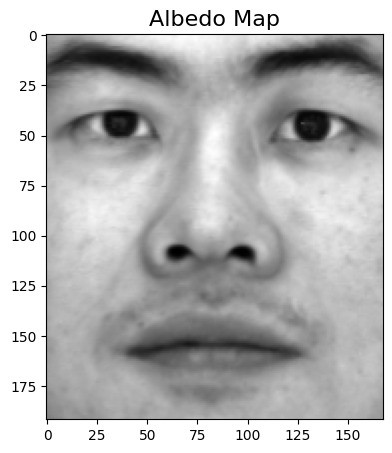

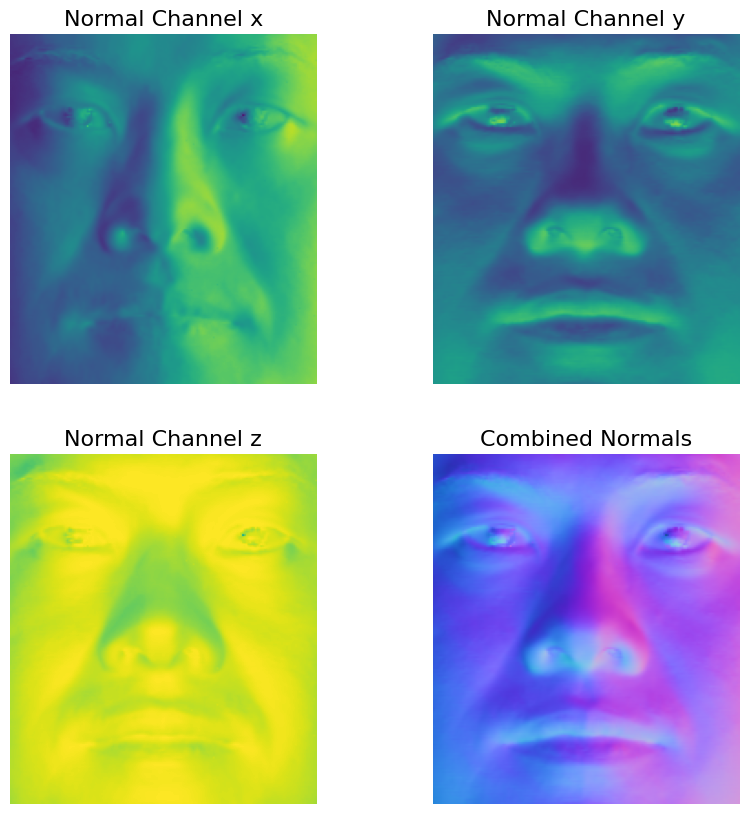

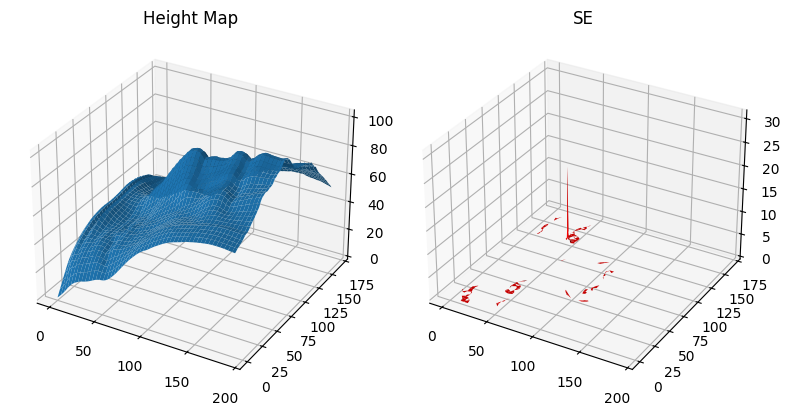

column-major height map
Loading images...

Finish loading 55 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 667

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


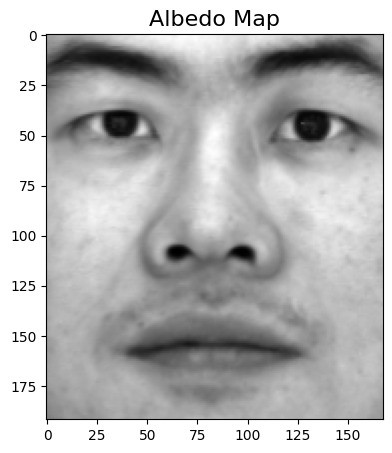

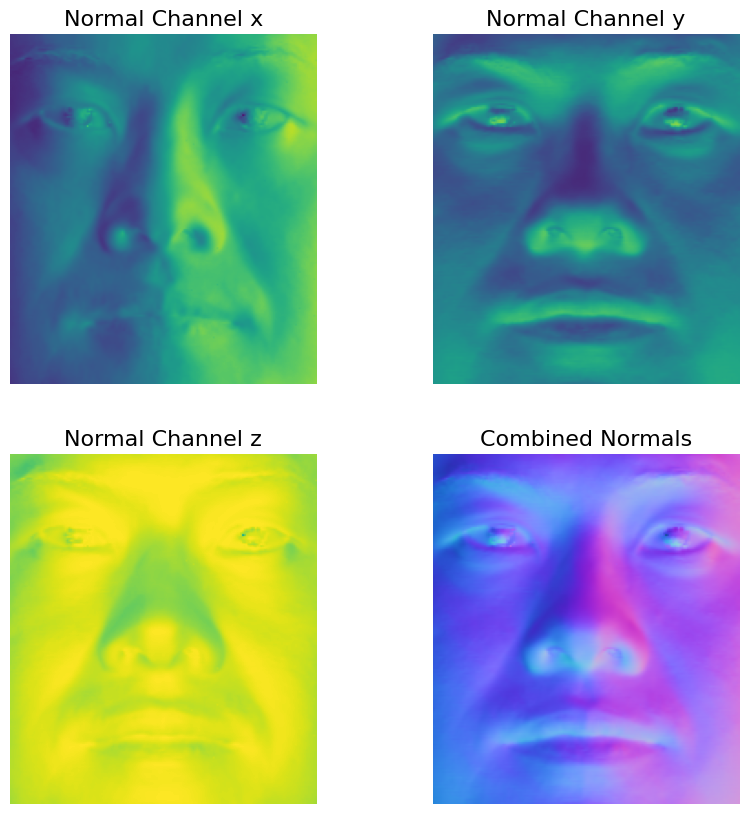

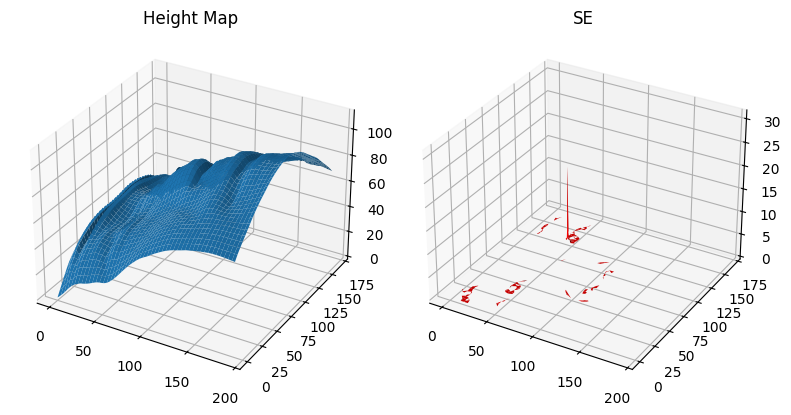

row-major height map
Loading images...

Finish loading 55 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 667

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


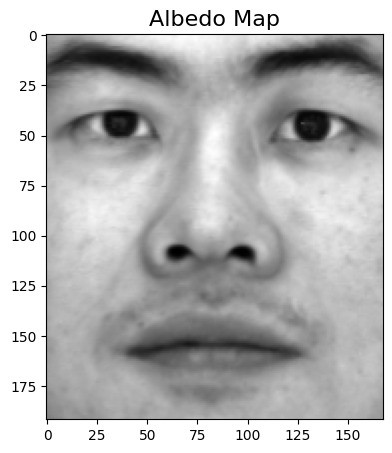

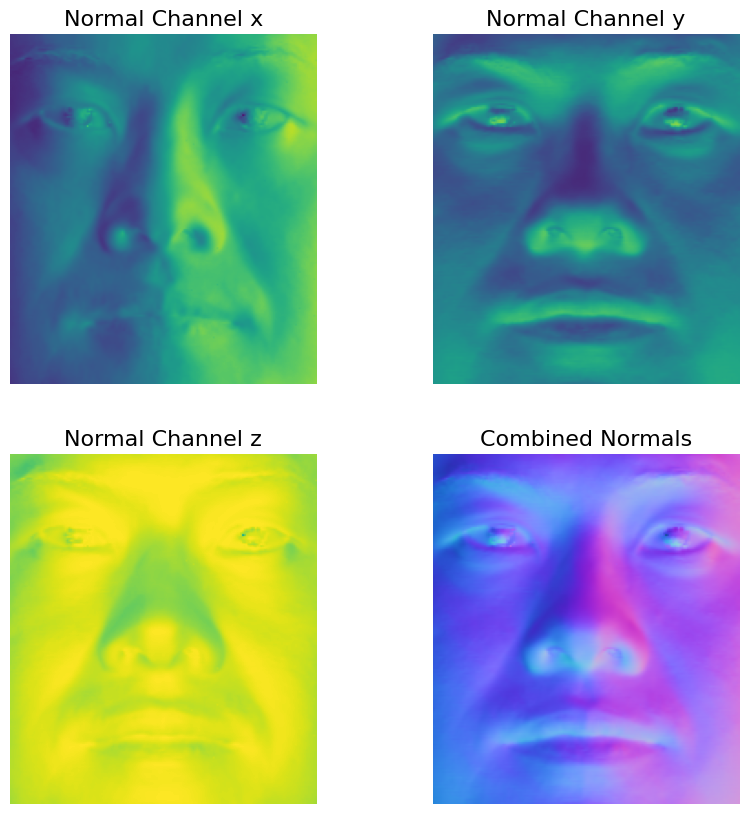

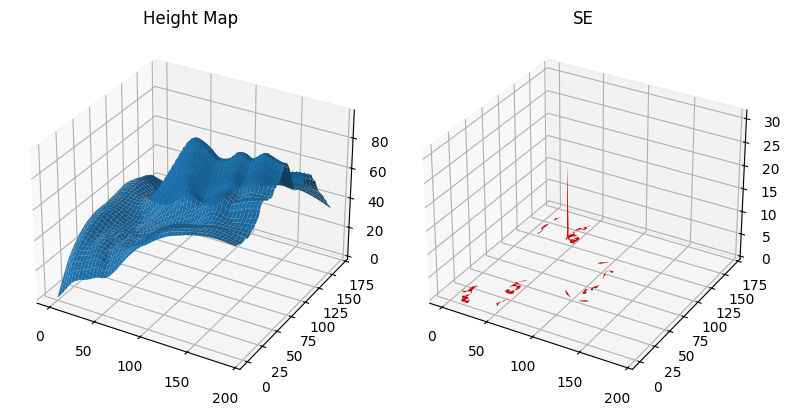

In [179]:
# Bad images
bad_images = ['yaleB02_P00A+095E+00.pgm',
              'yaleB02_P00A+110E-20.pgm',
              'yaleB02_P00A+110E+40.pgm',
              'yaleB02_P00A+110E+65.pgm',
              'yaleB02_P00A+120E+00.pgm', 
              'yaleB02_P00A-110E-20.pgm',
              'yaleB02_P00A-110E-20.pgm',
              'yaleB02_P00A-110E+40.pgm',
              'yaleB02_P00A-110E+65.pgm',
              'yaleB02_P00A-120E+00.pgm',
              'yaleB02_P00A-130E+00.pgm',]

# Make sure to display the results for the Face dataset using the 3 paths (column-major, row-major, and average) when constructing the surface height map.
print('average height map')
photometric_stereo_face_filtered(path_type='average', bad_images=bad_images)

print('column-major height map')
photometric_stereo_face_filtered(path_type='column', bad_images=bad_images)

print('row-major height map')
photometric_stereo_face_filtered(path_type='row', bad_images=bad_images)

<a id="question-35"></a>
#### <font color='#FF0000'>Question 35 (1 point)</font>

Discuss the results obtained after removing the problematic images. What are the differences in the results, and how do they compare to the original results?

##### <font color='yellow'>Answer:</font>

>*Write your answer here.*

<a id="question-36"></a>
#### <font color='#FF0000'>Question 36 (4 points)</font>

Now, it's time to apply the algorithm to the Apple dataset using real-world 3-channel RGB inputs.

For the Apple dataset, you should:
- Load the images
- Compute the surface albedo and normal map
- Run the integrability check
- Find the number of outliers
- Compute the surface height
- Show the results

Use the images in the "Apple" folder. The `load_apple_images` function is provided as a helper. You should complete the `photometric_stereo_apple_dataset` function as part of this task.

Observe and discuss the results for different integration paths. You may encounter difficulties using this non-synthetic dataset—try if filtering may help.

Make sure to display the results using the 3 paths (column-major, row-major, and average) when constructing the surface height map.

In [180]:
def load_apple_images(image_dir='./photometrics_images/Apple'):
    """
    Loads a set of apple images from the Apple dataset and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Apple images. Defaults to './photometrics_images/Apple/'.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with only the red channel extracted and normalized.
            - scriptV: An array of light direction vectors corresponding to each image.
    """

    # define the number of images to load
    num_images = 99
    
    # load a sample image to determine its dimensions
    filename = os.path.join(image_dir, 'I_0000.png')
    try_image = cv2.imread(filename, -1)
    
    # get the height and width of the sample image
    h, w = try_image[:,:,0].shape

    # import glob to find all image files in the directory
    import glob
    
    # get a list of all image files that match the pattern for the Apple dataset
    d = glob.glob(os.path.join(image_dir, 'I_00*.png'))
    
    # randomly select a subset of images to match the num_images count
    import random
    d = random.sample(d, num_images)
    
    # extract the base filenames from the list of image paths and their corresponding indices
    filenames = [os.path.basename(x) for x in d]
    filenames_idx = [int(i.split('_')[1].split('.')[0]) for i in filenames]

    # initialize arrays for storing angles and image data
    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    # loop through each selected image file
    for j in range(num_images):
        # load the image and extract the red channel (index 2)
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1)[:,:,2]

    # read light direction vectors from the provided file
    with open('./photometrics_images/Apple/light_directions_refined.txt') as file:
        lines = [line.split() for line in file]
        x, y, z = [], [], []
        
        # extract light directions corresponding to the selected images
        for idx in filenames_idx:
            x.append(float(lines[idx][0]))
            y.append(float(lines[idx][1]))
            z.append(float(lines[idx][2]))

    # combine the direction vectors, adjusting for normal direction
    scriptV = [1,-1,1] * np.array([x,y,z]).transpose(1,0)  ##eggonz COMMENT: fix (1,-1,1) normal directiona

    # convert the image stack to double precision
    image_stack = np.double(image_stack)
    
    # set any negative pixel values to 0 (removing underflow)
    image_stack[image_stack < 0] = 0
    
    # find the minimum and maximum pixel values in the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    
    # normalize the image stack to have values between 0 and 1, or set to zeros if min and max are equal
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  # avoid failure when all pixel values are the same

    # return the processed image stack and light directions
    return image_stack, scriptV

In [181]:
def photometric_stereo_apple_dataset(image_dir='./photometrics_images/Apple/', path_type='average'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Apple Dataset under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './photometrics_images/Apple/').
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_apple_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')

    # YOUR CODE HERE
    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=False)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    # YOUR CODE HERE
    p, q, SE = check_integrability(normals)


    # YOUR CODE HERE
    threshold = 0.01


    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height map
    print('Computing surface height map...\n')

    # YOUR CODE HERE
    height_map = construct_surface(p, q, path_type)
    

    # show results
    print('Displaying results...\n')

    # YOUR CODE HERE
    show_results(albedo, normals, height_map=height_map, SE=SE, show_normals=False)

If you estimate the albedo and surface normal using the three path types, the cell below will run for at least 1 minute.

average height map
Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 5859

Computing surface height map...

Displaying results...

Albedo shape: (696, 646)


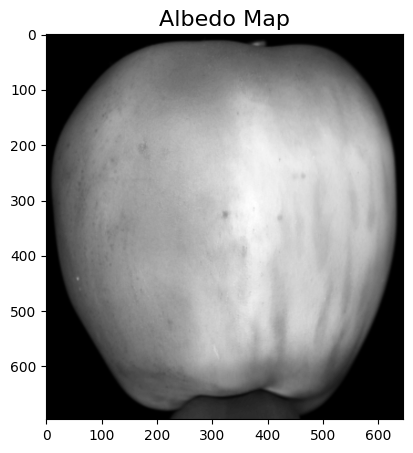

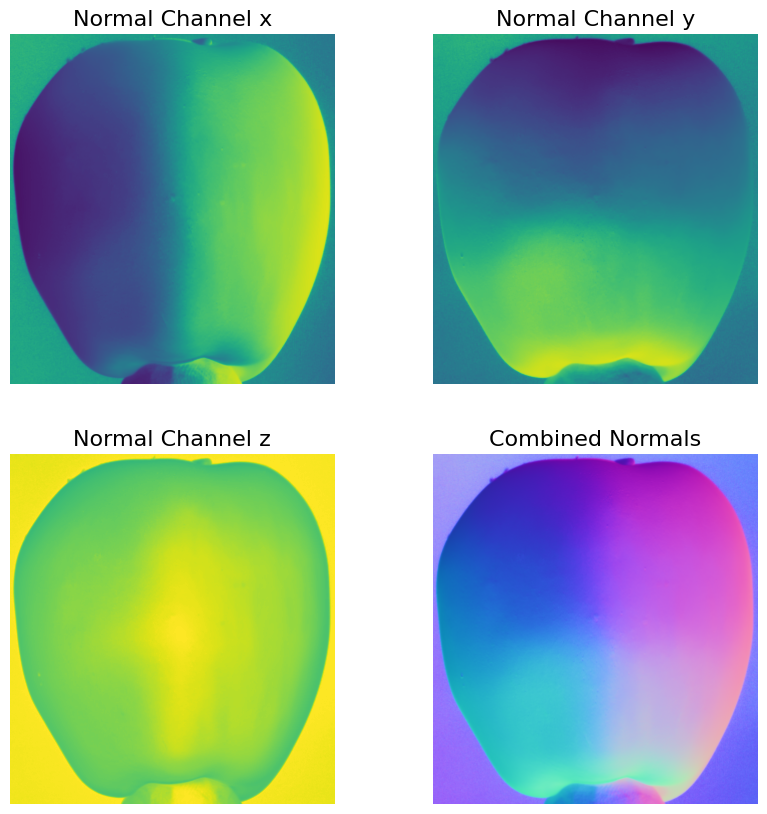

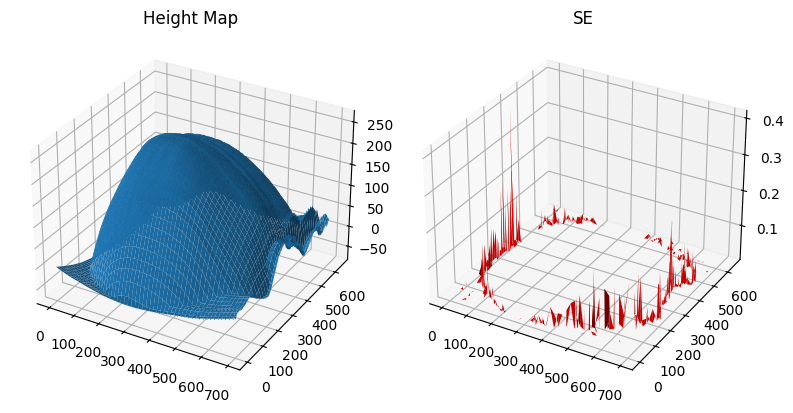

column-major height map
Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 5859

Computing surface height map...

Displaying results...

Albedo shape: (696, 646)


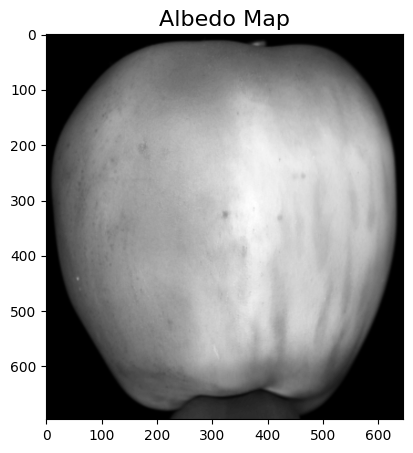

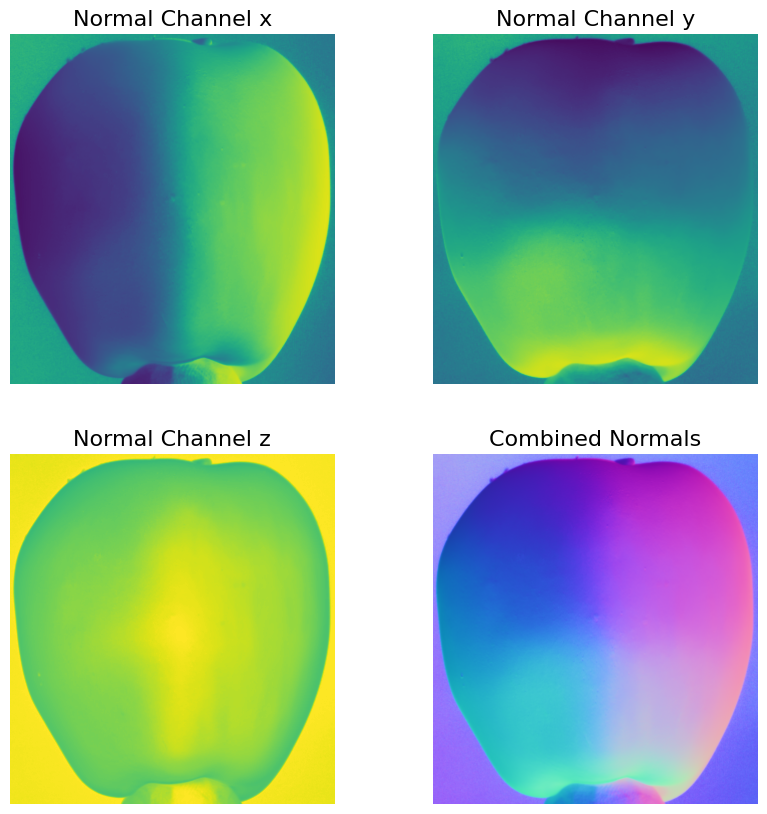

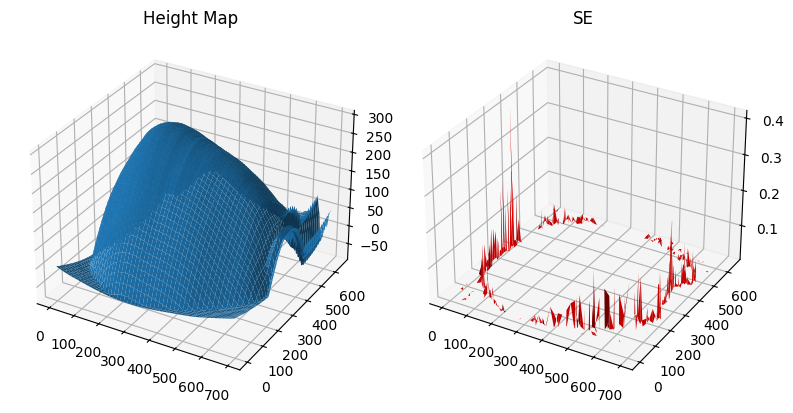

row-major height map
Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 5859

Computing surface height map...

Displaying results...

Albedo shape: (696, 646)


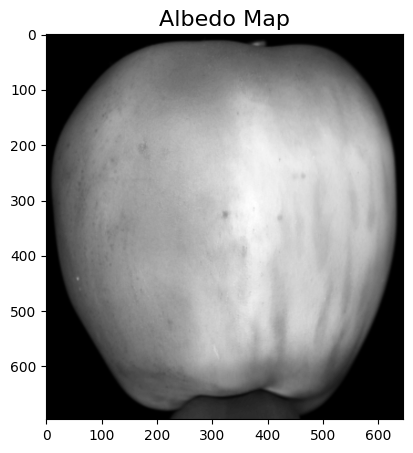

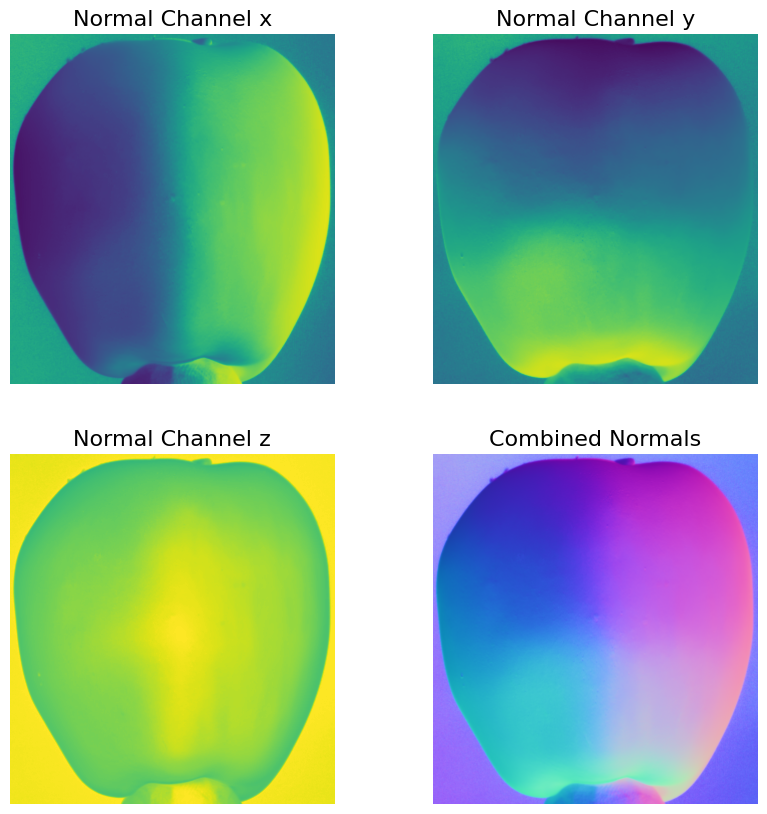

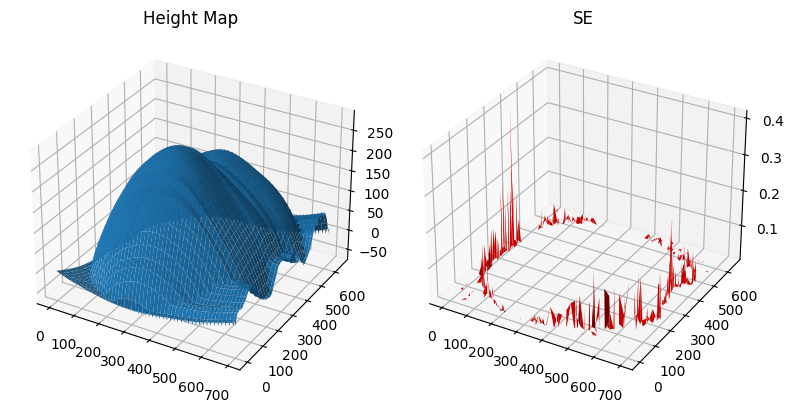

In [182]:
# Show the results for the Apple dataset using the 3 paths (column-major, row-major, and average) when constructing the surface height map.
print('average height map')
photometric_stereo_apple_dataset(path_type='average')

print('column-major height map')
photometric_stereo_apple_dataset(path_type='column')

print('row-major height map')
photometric_stereo_apple_dataset(path_type='row')

<a id="question-37"></a>
#### <font color='#FF0000'>Question 37 (1 point)</font>

Observe and discuss the results for different integration paths in the `photometric_stereo_apple_dataset` function.

##### <font color='yellow'>Answer:</font>

> In both integration paths, we can see a specific zones that look strange which corresponds to the shiny part of the apple. This is due to the fact that this shiny part does not follow the Lambertian model and hence it creates problems in the computation of the normals.
> 
> When we integrate along the horizontal direction, this region appears white, which causes abrupt changes in the derivative (positively), followed by a sharp negative change once we leave the section. This results in a bump in the height map.
> When we integrate along the vertical direction, the same happens, but the bump seems more pronounced since the reflections are predominantly vertical. Henceforth, the vertical integration shows a more pronounced bump, since only a few vertical lines are affected by the shiny part, while their neighbour verticals are not, creating the discontinuity we see in the height map. The shiny part affects all horizontal lines, hence we see a bump in the height map but not a discontinuity.
> 
> The average method gives us a smoother height map, since it averages both results and > compensates the errors. However, we can still see the bump.

<a id="section-x"></a>
### **Section X: Individual Contribution Report *(Mandatory)***

Because we want each student to contribute fairly to the submitted work, we ask you to fill out the textcells below. Write down your contribution to each of the assignment components in percentages. Naturally, percentages for one particular component should add up to 100% (e.g. 30% - 30% - 40%). No further explanation has to be given.

| Name | Contribution on Research | Contribution on Programming | Contribution on Writing |
| -------- | ------- | ------- | ------- |
|  | - % | - % | - % |
|  | - % | - % | - % |
|  | - % | - % | - % |

### - End of Notebook -